In [1]:
import scanpy as sc
sc.settings.verbosity = 3
sc.logging.print_header()
sc.settings.set_figure_params(dpi=80,facecolor='white')

from genevector.data import GeneVectorDataset
from genevector.model import GeneVector
from genevector.embedding import GeneEmbedding, CellEmbedding

scanpy==1.9.1 anndata==0.8.0 umap==0.5.3 numpy==1.21.6 scipy==1.9.0 pandas==1.4.3 scikit-learn==1.0.2 statsmodels==0.13.2 python-igraph==0.9.11 pynndescent==0.5.7


In [65]:
adata = sc.read("PBMC.h5ad")
adata

AnnData object with n_obs × n_vars = 14039 × 1000
    obs: 'batch', 'log_counts', 'n_counts', 'n_genes', 'sample', 'celltype', 'detailed_celltype'
    var: 'n_cells-0', 'n_cells-1', 'highly_variable', 'highly_variable_rank', 'means', 'variances', 'variances_norm'
    uns: 'hvg'

# Process Data

In [66]:
dataset = GeneVectorDataset(adata)

Loading Expression.


100%|██████████| 1051348/1051348 [00:01<00:00, 744303.52it/s]


Reindexing Cooc


100%|██████████| 14039/14039 [00:00<00:00, 37920.19it/s]


# Setup Model

In [67]:
xdata = adata.copy()
sc.pp.normalize_total(xdata)
sc.pp.log1p(xdata)

tdata = xdata.copy()
gdata = tdata.T
sc.tl.pca(gdata,n_comps=100)

normalizing counts per cell
    finished (0:00:00)
computing PCA
    with n_comps=100
    finished (0:00:00)


# Train Network

In [68]:
import tqdm
embed = GeneEmbedding("pbmc.vec", dataset, vector="average")

embed.embeddings
nembeddings = dict()
for gene, component in zip(adata.var.index,gdata.obsm["X_pca"]):
    c = list(component)
    nembeddings[gene] = c
embed.embeddings = nembeddings

embed.vector = []
embed.genes = []

for gene in tqdm.tqdm(embed.embeddings.keys()):
    embed.vector.append(embed.embeddings[gene])
    embed.genes.append(gene)


Loading average of 1st and 2nd weights.


100%|██████████| 1000/1000 [00:00<00:00, 2299508.77it/s]


In [74]:
print(embed.compute_similarities("CD8B")[:30])

        Gene  Similarity
0       CD8B    1.000000
1       CD8A    0.853975
2     AMICA1    0.545427
3       CD27    0.465908
4       LAG3    0.422961
5      WDR61    0.413377
6      CPNE2    0.409185
7      S100B    0.407764
8       GZMK    0.403740
9      CXCR3    0.392727
10     STMN1    0.384632
11     LRRN3    0.283769
12     ITM2C    0.276967
13      IL32    0.274584
14      PASK    0.270118
15  C12orf75    0.254858
16     TIGIT    0.247039
17    EXOSC5    0.245600
18     USP47    0.240846
19      AQP3    0.239746
20      CCR7    0.238395
21      RGCC    0.229525
22      CCL5    0.218364
23      WTAP    0.216563
24       LTB    0.209777
25   GPATCH4    0.207679
26     KTI12    0.206925
27     IL23A    0.197048
28    SMIM20    0.196518
29    SDF2L1    0.195935


# Get Cell Embedding

normalizing counts per cell
    finished (0:00:00)


100%|██████████| 14039/14039 [00:58<00:00, 238.78it/s]


computing neighbors
    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:00:03)
computing UMAP
    finished: added
    'X_umap', UMAP coordinates (adata.obsm) (0:00:12)


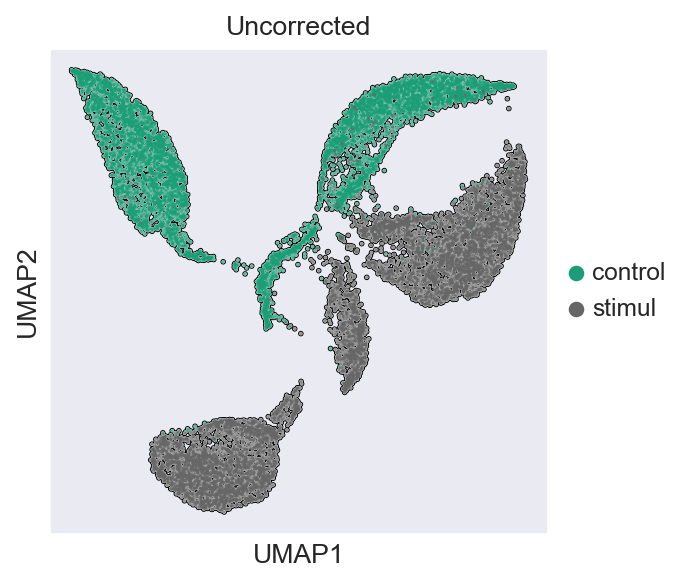

In [70]:
cembed = CellEmbedding(dataset, embed)
adata = cembed.get_adata()
sc.pl.umap(adata,palette="Dark2",color=["sample"], title=["Uncorrected"], add_outline=True)

# Batch Correction

Generating batch vectors.
Computing correction vector for stimul.
Applying correction vectors.
computing neighbors
    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:00:03)
computing UMAP
    finished: added
    'X_umap', UMAP coordinates (adata.obsm) (0:00:12)


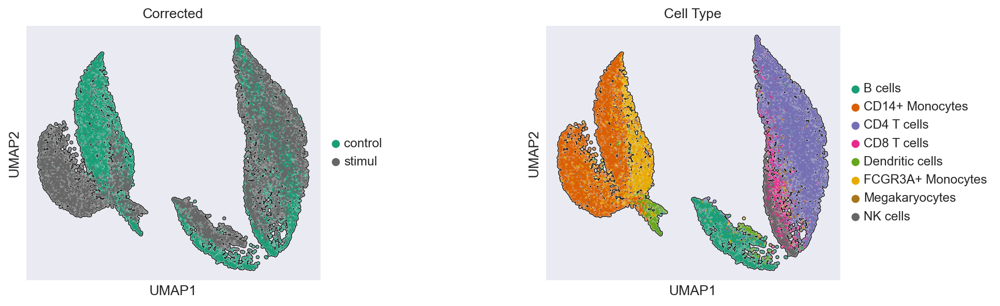

In [71]:
# cembed = CellEmbedding(dataset, embed)
cembed.batch_correct(column="sample",reference="control")
adata = cembed.get_adata()
sc.pl.umap(adata,palette="Dark2",color=["sample","celltype"], wspace=0.6,
                                 title=["Corrected","Cell Type"],add_outline=True,size=15)

# Plot Gene Similarity

        Gene  Similarity
0       CD8A    1.000000
1       CD8B    0.853975
2       LAG3    0.645723
3      CXCR3    0.602938
4       GZMK    0.601636
5      TIGIT    0.563913
6     AMICA1    0.529506
7       CST7    0.486652
8   C12orf75    0.472400
9       CCL5    0.453054
10      GZMH    0.391699
11     DUSP2    0.379213
12      NKG7    0.365656
13     KLRD1    0.352817
14      CTSW    0.334354
15     STMN1    0.326551
16     WDR61    0.319855
17      PRF1    0.316147
18      CD27    0.315705
19     USP47    0.313383


<AxesSubplot:xlabel='Similarity', ylabel='Gene'>

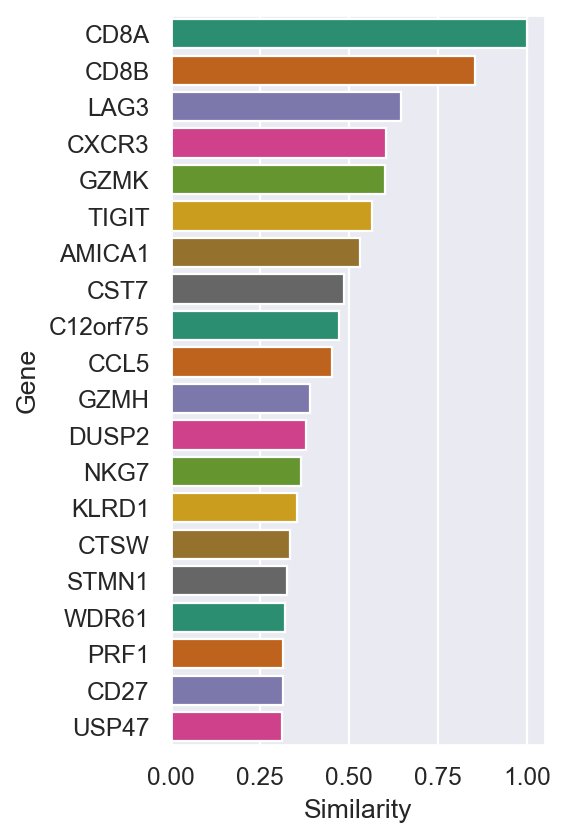

In [77]:
import matplotlib.pyplot as plt
import seaborn as sns
sns.set(font_scale=1.)
df = embed.compute_similarities("CD8A").head(20)
print(df)
fig,ax = plt.subplots(1,1,figsize=(3,6))
sns.barplot(data=df,y="Gene",x="Similarity",palette="Dark2",ax=ax)

# Get Gene Embedding

In [37]:
gdata = embed.get_adata()
metagenes = embed.get_metagenes(gdata)

computing neighbors
    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:00:00)
running Leiden clustering
    finished: found 166 clusters and added
    'leiden', the cluster labels (adata.obs, categorical) (0:00:00)
computing UMAP
    finished: added
    'X_umap', UMAP coordinates (adata.obsm) (0:00:01)


In [38]:
sc.pp.normalize_total(adata)
sc.pp.log1p(adata)
embed.score_metagenes(adata, metagenes)

normalizing counts per cell
    finished (0:00:00)
computing score '23_SCORE'
    finished: added
    '23_SCORE', score of gene set (adata.obs).
    241 total control genes are used. (0:00:00)
computing score '34_SCORE'
    finished: added
    '34_SCORE', score of gene set (adata.obs).
    67 total control genes are used. (0:00:00)
computing score '33_SCORE'
    finished: added
    '33_SCORE', score of gene set (adata.obs).
    284 total control genes are used. (0:00:00)
computing score '49_SCORE'
    finished: added
    '49_SCORE', score of gene set (adata.obs).
    203 total control genes are used. (0:00:00)
computing score '59_SCORE'


/Users/nceglia/miniconda/lib/python3.9/site-packages/scanpy/tools/_score_genes.py:151: FutureWarning: Passing a set as an indexer is deprecated and will raise in a future version. Use a list instead.
  for cut in np.unique(obs_cut.loc[gene_list]):
/Users/nceglia/miniconda/lib/python3.9/site-packages/scanpy/tools/_score_genes.py:151: FutureWarning: Passing a set as an indexer is deprecated and will raise in a future version. Use a list instead.
  for cut in np.unique(obs_cut.loc[gene_list]):
/Users/nceglia/miniconda/lib/python3.9/site-packages/scanpy/tools/_score_genes.py:151: FutureWarning: Passing a set as an indexer is deprecated and will raise in a future version. Use a list instead.
  for cut in np.unique(obs_cut.loc[gene_list]):
/Users/nceglia/miniconda/lib/python3.9/site-packages/scanpy/tools/_score_genes.py:151: FutureWarning: Passing a set as an indexer is deprecated and will raise in a future version. Use a list instead.
  for cut in np.unique(obs_cut.loc[gene_list]):
/Users/n

    finished: added
    '59_SCORE', score of gene set (adata.obs).
    204 total control genes are used. (0:00:00)
computing score '45_SCORE'
    finished: added
    '45_SCORE', score of gene set (adata.obs).
    203 total control genes are used. (0:00:00)
computing score '18_SCORE'
    finished: added
    '18_SCORE', score of gene set (adata.obs).
    240 total control genes are used. (0:00:00)
computing score '5_SCORE'
    finished: added
    '5_SCORE', score of gene set (adata.obs).
    363 total control genes are used. (0:00:00)
computing score '52_SCORE'
    finished: added
    '52_SCORE', score of gene set (adata.obs).
    120 total control genes are used. (0:00:00)
computing score '27_SCORE'


/Users/nceglia/miniconda/lib/python3.9/site-packages/scanpy/tools/_score_genes.py:151: FutureWarning: Passing a set as an indexer is deprecated and will raise in a future version. Use a list instead.
  for cut in np.unique(obs_cut.loc[gene_list]):
/Users/nceglia/miniconda/lib/python3.9/site-packages/scanpy/tools/_score_genes.py:151: FutureWarning: Passing a set as an indexer is deprecated and will raise in a future version. Use a list instead.
  for cut in np.unique(obs_cut.loc[gene_list]):
/Users/nceglia/miniconda/lib/python3.9/site-packages/scanpy/tools/_score_genes.py:151: FutureWarning: Passing a set as an indexer is deprecated and will raise in a future version. Use a list instead.
  for cut in np.unique(obs_cut.loc[gene_list]):
/Users/nceglia/miniconda/lib/python3.9/site-packages/scanpy/tools/_score_genes.py:151: FutureWarning: Passing a set as an indexer is deprecated and will raise in a future version. Use a list instead.
  for cut in np.unique(obs_cut.loc[gene_list]):
/Users/n

    finished: added
    '27_SCORE', score of gene set (adata.obs).
    158 total control genes are used. (0:00:00)
computing score '61_SCORE'
    finished: added
    '61_SCORE', score of gene set (adata.obs).
    204 total control genes are used. (0:00:00)
computing score '54_SCORE'
    finished: added
    '54_SCORE', score of gene set (adata.obs).
    120 total control genes are used. (0:00:00)
computing score '131_SCORE'
    finished: added
    '131_SCORE', score of gene set (adata.obs).
    123 total control genes are used. (0:00:00)
computing score '60_SCORE'
    finished: added
    '60_SCORE', score of gene set (adata.obs).
    163 total control genes are used. (0:00:00)
computing score '124_SCORE'
    finished: added
    '124_SCORE', score of gene set (adata.obs).
    123 total control genes are used. (0:00:00)
computing score '13_SCORE'


/Users/nceglia/miniconda/lib/python3.9/site-packages/scanpy/tools/_score_genes.py:151: FutureWarning: Passing a set as an indexer is deprecated and will raise in a future version. Use a list instead.
  for cut in np.unique(obs_cut.loc[gene_list]):
/Users/nceglia/miniconda/lib/python3.9/site-packages/scanpy/tools/_score_genes.py:151: FutureWarning: Passing a set as an indexer is deprecated and will raise in a future version. Use a list instead.
  for cut in np.unique(obs_cut.loc[gene_list]):
/Users/nceglia/miniconda/lib/python3.9/site-packages/scanpy/tools/_score_genes.py:151: FutureWarning: Passing a set as an indexer is deprecated and will raise in a future version. Use a list instead.
  for cut in np.unique(obs_cut.loc[gene_list]):
/Users/nceglia/miniconda/lib/python3.9/site-packages/scanpy/tools/_score_genes.py:151: FutureWarning: Passing a set as an indexer is deprecated and will raise in a future version. Use a list instead.
  for cut in np.unique(obs_cut.loc[gene_list]):
/Users/n

    finished: added
    '13_SCORE', score of gene set (adata.obs).
    323 total control genes are used. (0:00:00)
computing score '65_SCORE'
    finished: added
    '65_SCORE', score of gene set (adata.obs).
    163 total control genes are used. (0:00:00)
computing score '73_SCORE'
    finished: added
    '73_SCORE', score of gene set (adata.obs).
    163 total control genes are used. (0:00:00)
computing score '8_SCORE'
    finished: added
    '8_SCORE', score of gene set (adata.obs).
    197 total control genes are used. (0:00:00)
computing score '0_SCORE'


/Users/nceglia/miniconda/lib/python3.9/site-packages/scanpy/tools/_score_genes.py:151: FutureWarning: Passing a set as an indexer is deprecated and will raise in a future version. Use a list instead.
  for cut in np.unique(obs_cut.loc[gene_list]):
/Users/nceglia/miniconda/lib/python3.9/site-packages/scanpy/tools/_score_genes.py:151: FutureWarning: Passing a set as an indexer is deprecated and will raise in a future version. Use a list instead.
  for cut in np.unique(obs_cut.loc[gene_list]):
/Users/nceglia/miniconda/lib/python3.9/site-packages/scanpy/tools/_score_genes.py:151: FutureWarning: Passing a set as an indexer is deprecated and will raise in a future version. Use a list instead.
  for cut in np.unique(obs_cut.loc[gene_list]):
/Users/nceglia/miniconda/lib/python3.9/site-packages/scanpy/tools/_score_genes.py:151: FutureWarning: Passing a set as an indexer is deprecated and will raise in a future version. Use a list instead.
  for cut in np.unique(obs_cut.loc[gene_list]):
/Users/n

    finished: added
    '0_SCORE', score of gene set (adata.obs).
    149 total control genes are used. (0:00:00)
computing score '25_SCORE'
    finished: added
    '25_SCORE', score of gene set (adata.obs).
    241 total control genes are used. (0:00:00)
computing score '36_SCORE'
    finished: added
    '36_SCORE', score of gene set (adata.obs).
    201 total control genes are used. (0:00:00)
computing score '19_SCORE'
    finished: added
    '19_SCORE', score of gene set (adata.obs).
    114 total control genes are used. (0:00:00)
computing score '62_SCORE'
    finished: added
    '62_SCORE', score of gene set (adata.obs).
    79 total control genes are used. (0:00:00)
computing score '74_SCORE'
    finished: added
    '74_SCORE', score of gene set (adata.obs).
    163 total control genes are used. (0:00:00)


/Users/nceglia/miniconda/lib/python3.9/site-packages/scanpy/tools/_score_genes.py:151: FutureWarning: Passing a set as an indexer is deprecated and will raise in a future version. Use a list instead.
  for cut in np.unique(obs_cut.loc[gene_list]):
/Users/nceglia/miniconda/lib/python3.9/site-packages/scanpy/tools/_score_genes.py:151: FutureWarning: Passing a set as an indexer is deprecated and will raise in a future version. Use a list instead.
  for cut in np.unique(obs_cut.loc[gene_list]):
/Users/nceglia/miniconda/lib/python3.9/site-packages/scanpy/tools/_score_genes.py:151: FutureWarning: Passing a set as an indexer is deprecated and will raise in a future version. Use a list instead.
  for cut in np.unique(obs_cut.loc[gene_list]):
/Users/nceglia/miniconda/lib/python3.9/site-packages/scanpy/tools/_score_genes.py:151: FutureWarning: Passing a set as an indexer is deprecated and will raise in a future version. Use a list instead.
  for cut in np.unique(obs_cut.loc[gene_list]):
/Users/n

computing score '86_SCORE'
    finished: added
    '86_SCORE', score of gene set (adata.obs).
    205 total control genes are used. (0:00:00)
computing score '63_SCORE'
    finished: added
    '63_SCORE', score of gene set (adata.obs).
    163 total control genes are used. (0:00:00)
computing score '64_SCORE'
    finished: added
    '64_SCORE', score of gene set (adata.obs).
    163 total control genes are used. (0:00:00)
computing score '125_SCORE'
    finished: added
    '125_SCORE', score of gene set (adata.obs).
    122 total control genes are used. (0:00:00)
computing score '4_SCORE'
    finished: added
    '4_SCORE', score of gene set (adata.obs).
    320 total control genes are used. (0:00:00)
computing score '41_SCORE'


/Users/nceglia/miniconda/lib/python3.9/site-packages/scanpy/tools/_score_genes.py:151: FutureWarning: Passing a set as an indexer is deprecated and will raise in a future version. Use a list instead.
  for cut in np.unique(obs_cut.loc[gene_list]):
/Users/nceglia/miniconda/lib/python3.9/site-packages/scanpy/tools/_score_genes.py:151: FutureWarning: Passing a set as an indexer is deprecated and will raise in a future version. Use a list instead.
  for cut in np.unique(obs_cut.loc[gene_list]):
/Users/nceglia/miniconda/lib/python3.9/site-packages/scanpy/tools/_score_genes.py:151: FutureWarning: Passing a set as an indexer is deprecated and will raise in a future version. Use a list instead.
  for cut in np.unique(obs_cut.loc[gene_list]):
/Users/nceglia/miniconda/lib/python3.9/site-packages/scanpy/tools/_score_genes.py:151: FutureWarning: Passing a set as an indexer is deprecated and will raise in a future version. Use a list instead.
  for cut in np.unique(obs_cut.loc[gene_list]):
/Users/n

    finished: added
    '41_SCORE', score of gene set (adata.obs).
    117 total control genes are used. (0:00:00)
computing score '39_SCORE'
    finished: added
    '39_SCORE', score of gene set (adata.obs).
    118 total control genes are used. (0:00:00)
computing score '111_SCORE'
    finished: added
    '111_SCORE', score of gene set (adata.obs).
    121 total control genes are used. (0:00:00)
computing score '1_SCORE'
    finished: added
    '1_SCORE', score of gene set (adata.obs).
    402 total control genes are used. (0:00:00)
computing score '30_SCORE'


/Users/nceglia/miniconda/lib/python3.9/site-packages/scanpy/tools/_score_genes.py:151: FutureWarning: Passing a set as an indexer is deprecated and will raise in a future version. Use a list instead.
  for cut in np.unique(obs_cut.loc[gene_list]):
/Users/nceglia/miniconda/lib/python3.9/site-packages/scanpy/tools/_score_genes.py:151: FutureWarning: Passing a set as an indexer is deprecated and will raise in a future version. Use a list instead.
  for cut in np.unique(obs_cut.loc[gene_list]):
/Users/nceglia/miniconda/lib/python3.9/site-packages/scanpy/tools/_score_genes.py:151: FutureWarning: Passing a set as an indexer is deprecated and will raise in a future version. Use a list instead.
  for cut in np.unique(obs_cut.loc[gene_list]):
/Users/nceglia/miniconda/lib/python3.9/site-packages/scanpy/tools/_score_genes.py:151: FutureWarning: Passing a set as an indexer is deprecated and will raise in a future version. Use a list instead.
  for cut in np.unique(obs_cut.loc[gene_list]):
/Users/n

    finished: added
    '30_SCORE', score of gene set (adata.obs).
    200 total control genes are used. (0:00:00)
computing score '15_SCORE'
    finished: added
    '15_SCORE', score of gene set (adata.obs).
    240 total control genes are used. (0:00:00)
computing score '79_SCORE'
    finished: added
    '79_SCORE', score of gene set (adata.obs).
    121 total control genes are used. (0:00:00)
computing score '69_SCORE'
    finished: added
    '69_SCORE', score of gene set (adata.obs).
    205 total control genes are used. (0:00:00)
computing score '88_SCORE'
    finished: added
    '88_SCORE', score of gene set (adata.obs).
    79 total control genes are used. (0:00:00)
computing score '48_SCORE'
    finished: added
    '48_SCORE', score of gene set (adata.obs).
    203 total control genes are used. (0:00:00)
computing score '28_SCORE'


/Users/nceglia/miniconda/lib/python3.9/site-packages/scanpy/tools/_score_genes.py:151: FutureWarning: Passing a set as an indexer is deprecated and will raise in a future version. Use a list instead.
  for cut in np.unique(obs_cut.loc[gene_list]):
/Users/nceglia/miniconda/lib/python3.9/site-packages/scanpy/tools/_score_genes.py:151: FutureWarning: Passing a set as an indexer is deprecated and will raise in a future version. Use a list instead.
  for cut in np.unique(obs_cut.loc[gene_list]):
/Users/nceglia/miniconda/lib/python3.9/site-packages/scanpy/tools/_score_genes.py:151: FutureWarning: Passing a set as an indexer is deprecated and will raise in a future version. Use a list instead.
  for cut in np.unique(obs_cut.loc[gene_list]):
/Users/nceglia/miniconda/lib/python3.9/site-packages/scanpy/tools/_score_genes.py:151: FutureWarning: Passing a set as an indexer is deprecated and will raise in a future version. Use a list instead.
  for cut in np.unique(obs_cut.loc[gene_list]):
/Users/n

    finished: added
    '28_SCORE', score of gene set (adata.obs).
    242 total control genes are used. (0:00:00)
computing score '140_SCORE'
    finished: added
    '140_SCORE', score of gene set (adata.obs).
    123 total control genes are used. (0:00:00)
computing score '9_SCORE'
    finished: added
    '9_SCORE', score of gene set (adata.obs).
    148 total control genes are used. (0:00:00)
computing score '87_SCORE'
    finished: added
    '87_SCORE', score of gene set (adata.obs).
    163 total control genes are used. (0:00:00)
computing score '85_SCORE'
    finished: added
    '85_SCORE', score of gene set (adata.obs).
    79 total control genes are used. (0:00:00)
computing score '148_SCORE'


/Users/nceglia/miniconda/lib/python3.9/site-packages/scanpy/tools/_score_genes.py:151: FutureWarning: Passing a set as an indexer is deprecated and will raise in a future version. Use a list instead.
  for cut in np.unique(obs_cut.loc[gene_list]):
/Users/nceglia/miniconda/lib/python3.9/site-packages/scanpy/tools/_score_genes.py:151: FutureWarning: Passing a set as an indexer is deprecated and will raise in a future version. Use a list instead.
  for cut in np.unique(obs_cut.loc[gene_list]):
/Users/nceglia/miniconda/lib/python3.9/site-packages/scanpy/tools/_score_genes.py:151: FutureWarning: Passing a set as an indexer is deprecated and will raise in a future version. Use a list instead.
  for cut in np.unique(obs_cut.loc[gene_list]):
/Users/nceglia/miniconda/lib/python3.9/site-packages/scanpy/tools/_score_genes.py:151: FutureWarning: Passing a set as an indexer is deprecated and will raise in a future version. Use a list instead.
  for cut in np.unique(obs_cut.loc[gene_list]):
/Users/n

    finished: added
    '148_SCORE', score of gene set (adata.obs).
    123 total control genes are used. (0:00:00)
computing score '101_SCORE'
    finished: added
    '101_SCORE', score of gene set (adata.obs).
    122 total control genes are used. (0:00:00)
computing score '116_SCORE'
    finished: added
    '116_SCORE', score of gene set (adata.obs).
    163 total control genes are used. (0:00:00)
computing score '119_SCORE'
    finished: added
    '119_SCORE', score of gene set (adata.obs).
    122 total control genes are used. (0:00:00)
computing score '90_SCORE'
    finished: added
    '90_SCORE', score of gene set (adata.obs).
    163 total control genes are used. (0:00:00)
computing score '157_SCORE'


/Users/nceglia/miniconda/lib/python3.9/site-packages/scanpy/tools/_score_genes.py:151: FutureWarning: Passing a set as an indexer is deprecated and will raise in a future version. Use a list instead.
  for cut in np.unique(obs_cut.loc[gene_list]):
/Users/nceglia/miniconda/lib/python3.9/site-packages/scanpy/tools/_score_genes.py:151: FutureWarning: Passing a set as an indexer is deprecated and will raise in a future version. Use a list instead.
  for cut in np.unique(obs_cut.loc[gene_list]):
/Users/nceglia/miniconda/lib/python3.9/site-packages/scanpy/tools/_score_genes.py:151: FutureWarning: Passing a set as an indexer is deprecated and will raise in a future version. Use a list instead.
  for cut in np.unique(obs_cut.loc[gene_list]):
/Users/nceglia/miniconda/lib/python3.9/site-packages/scanpy/tools/_score_genes.py:151: FutureWarning: Passing a set as an indexer is deprecated and will raise in a future version. Use a list instead.
  for cut in np.unique(obs_cut.loc[gene_list]):
/Users/n

    finished: added
    '157_SCORE', score of gene set (adata.obs).
    81 total control genes are used. (0:00:00)
computing score '100_SCORE'
    finished: added
    '100_SCORE', score of gene set (adata.obs).
    80 total control genes are used. (0:00:00)
computing score '113_SCORE'
    finished: added
    '113_SCORE', score of gene set (adata.obs).
    163 total control genes are used. (0:00:00)
computing score '126_SCORE'
    finished: added
    '126_SCORE', score of gene set (adata.obs).
    81 total control genes are used. (0:00:00)
computing score '68_SCORE'
    finished: added
    '68_SCORE', score of gene set (adata.obs).
    121 total control genes are used. (0:00:00)
computing score '164_SCORE'
    finished: added
    '164_SCORE', score of gene set (adata.obs).
    40 total control genes are used. (0:00:00)
computing score '56_SCORE'
    finished: added
    '56_SCORE', score of gene set (adata.obs).
    29 total control genes are used. (0:00:00)
computing score '2_SCORE'


/Users/nceglia/miniconda/lib/python3.9/site-packages/scanpy/tools/_score_genes.py:151: FutureWarning: Passing a set as an indexer is deprecated and will raise in a future version. Use a list instead.
  for cut in np.unique(obs_cut.loc[gene_list]):
/Users/nceglia/miniconda/lib/python3.9/site-packages/scanpy/tools/_score_genes.py:151: FutureWarning: Passing a set as an indexer is deprecated and will raise in a future version. Use a list instead.
  for cut in np.unique(obs_cut.loc[gene_list]):
/Users/nceglia/miniconda/lib/python3.9/site-packages/scanpy/tools/_score_genes.py:151: FutureWarning: Passing a set as an indexer is deprecated and will raise in a future version. Use a list instead.
  for cut in np.unique(obs_cut.loc[gene_list]):
/Users/nceglia/miniconda/lib/python3.9/site-packages/scanpy/tools/_score_genes.py:151: FutureWarning: Passing a set as an indexer is deprecated and will raise in a future version. Use a list instead.
  for cut in np.unique(obs_cut.loc[gene_list]):
/Users/n

    finished: added
    '2_SCORE', score of gene set (adata.obs).
    278 total control genes are used. (0:00:00)
computing score '26_SCORE'
    finished: added
    '26_SCORE', score of gene set (adata.obs).
    66 total control genes are used. (0:00:00)
computing score '53_SCORE'
    finished: added
    '53_SCORE', score of gene set (adata.obs).
    204 total control genes are used. (0:00:00)
computing score '58_SCORE'
    finished: added
    '58_SCORE', score of gene set (adata.obs).
    204 total control genes are used. (0:00:00)
computing score '46_SCORE'


/Users/nceglia/miniconda/lib/python3.9/site-packages/scanpy/tools/_score_genes.py:151: FutureWarning: Passing a set as an indexer is deprecated and will raise in a future version. Use a list instead.
  for cut in np.unique(obs_cut.loc[gene_list]):
/Users/nceglia/miniconda/lib/python3.9/site-packages/scanpy/tools/_score_genes.py:151: FutureWarning: Passing a set as an indexer is deprecated and will raise in a future version. Use a list instead.
  for cut in np.unique(obs_cut.loc[gene_list]):
/Users/nceglia/miniconda/lib/python3.9/site-packages/scanpy/tools/_score_genes.py:151: FutureWarning: Passing a set as an indexer is deprecated and will raise in a future version. Use a list instead.
  for cut in np.unique(obs_cut.loc[gene_list]):
/Users/nceglia/miniconda/lib/python3.9/site-packages/scanpy/tools/_score_genes.py:151: FutureWarning: Passing a set as an indexer is deprecated and will raise in a future version. Use a list instead.
  for cut in np.unique(obs_cut.loc[gene_list]):
/Users/n

    finished: added
    '46_SCORE', score of gene set (adata.obs).
    119 total control genes are used. (0:00:00)
computing score '22_SCORE'
    finished: added
    '22_SCORE', score of gene set (adata.obs).
    115 total control genes are used. (0:00:00)
computing score '38_SCORE'
    finished: added
    '38_SCORE', score of gene set (adata.obs).
    243 total control genes are used. (0:00:00)
computing score '11_SCORE'
    finished: added
    '11_SCORE', score of gene set (adata.obs).
    113 total control genes are used. (0:00:00)
computing score '37_SCORE'
    finished: added
    '37_SCORE', score of gene set (adata.obs).
    159 total control genes are used. (0:00:00)
computing score '35_SCORE'


/Users/nceglia/miniconda/lib/python3.9/site-packages/scanpy/tools/_score_genes.py:151: FutureWarning: Passing a set as an indexer is deprecated and will raise in a future version. Use a list instead.
  for cut in np.unique(obs_cut.loc[gene_list]):
/Users/nceglia/miniconda/lib/python3.9/site-packages/scanpy/tools/_score_genes.py:151: FutureWarning: Passing a set as an indexer is deprecated and will raise in a future version. Use a list instead.
  for cut in np.unique(obs_cut.loc[gene_list]):
/Users/nceglia/miniconda/lib/python3.9/site-packages/scanpy/tools/_score_genes.py:151: FutureWarning: Passing a set as an indexer is deprecated and will raise in a future version. Use a list instead.
  for cut in np.unique(obs_cut.loc[gene_list]):
/Users/nceglia/miniconda/lib/python3.9/site-packages/scanpy/tools/_score_genes.py:151: FutureWarning: Passing a set as an indexer is deprecated and will raise in a future version. Use a list instead.
  for cut in np.unique(obs_cut.loc[gene_list]):
/Users/n

    finished: added
    '35_SCORE', score of gene set (adata.obs).
    327 total control genes are used. (0:00:00)
computing score '24_SCORE'
    finished: added
    '24_SCORE', score of gene set (adata.obs).
    234 total control genes are used. (0:00:00)
computing score '12_SCORE'
    finished: added
    '12_SCORE', score of gene set (adata.obs).
    407 total control genes are used. (0:00:00)
computing score '20_SCORE'
    finished: added
    '20_SCORE', score of gene set (adata.obs).
    324 total control genes are used. (0:00:00)
computing score '31_SCORE'


/Users/nceglia/miniconda/lib/python3.9/site-packages/scanpy/tools/_score_genes.py:151: FutureWarning: Passing a set as an indexer is deprecated and will raise in a future version. Use a list instead.
  for cut in np.unique(obs_cut.loc[gene_list]):
/Users/nceglia/miniconda/lib/python3.9/site-packages/scanpy/tools/_score_genes.py:151: FutureWarning: Passing a set as an indexer is deprecated and will raise in a future version. Use a list instead.
  for cut in np.unique(obs_cut.loc[gene_list]):
/Users/nceglia/miniconda/lib/python3.9/site-packages/scanpy/tools/_score_genes.py:151: FutureWarning: Passing a set as an indexer is deprecated and will raise in a future version. Use a list instead.
  for cut in np.unique(obs_cut.loc[gene_list]):
/Users/nceglia/miniconda/lib/python3.9/site-packages/scanpy/tools/_score_genes.py:151: FutureWarning: Passing a set as an indexer is deprecated and will raise in a future version. Use a list instead.
  for cut in np.unique(obs_cut.loc[gene_list]):


    finished: added
    '31_SCORE', score of gene set (adata.obs).
    242 total control genes are used. (0:00:00)
computing score '160_SCORE'
    finished: added
    '160_SCORE', score of gene set (adata.obs).
    82 total control genes are used. (0:00:00)
computing score '139_SCORE'
    finished: added
    '139_SCORE', score of gene set (adata.obs).
    123 total control genes are used. (0:00:00)


/Users/nceglia/miniconda/lib/python3.9/site-packages/scanpy/tools/_score_genes.py:151: FutureWarning: Passing a set as an indexer is deprecated and will raise in a future version. Use a list instead.
  for cut in np.unique(obs_cut.loc[gene_list]):
/Users/nceglia/miniconda/lib/python3.9/site-packages/scanpy/tools/_score_genes.py:151: FutureWarning: Passing a set as an indexer is deprecated and will raise in a future version. Use a list instead.
  for cut in np.unique(obs_cut.loc[gene_list]):


computing score '17_SCORE'
    finished: added
    '17_SCORE', score of gene set (adata.obs).
    240 total control genes are used. (0:00:00)
computing score '81_SCORE'
    finished: added
    '81_SCORE', score of gene set (adata.obs).
    120 total control genes are used. (0:00:00)
computing score '91_SCORE'
    finished: added
    '91_SCORE', score of gene set (adata.obs).
    164 total control genes are used. (0:00:00)
computing score '67_SCORE'
    finished: added
    '67_SCORE', score of gene set (adata.obs).
    205 total control genes are used. (0:00:00)
computing score '106_SCORE'


/Users/nceglia/miniconda/lib/python3.9/site-packages/scanpy/tools/_score_genes.py:151: FutureWarning: Passing a set as an indexer is deprecated and will raise in a future version. Use a list instead.
  for cut in np.unique(obs_cut.loc[gene_list]):
/Users/nceglia/miniconda/lib/python3.9/site-packages/scanpy/tools/_score_genes.py:151: FutureWarning: Passing a set as an indexer is deprecated and will raise in a future version. Use a list instead.
  for cut in np.unique(obs_cut.loc[gene_list]):
/Users/nceglia/miniconda/lib/python3.9/site-packages/scanpy/tools/_score_genes.py:151: FutureWarning: Passing a set as an indexer is deprecated and will raise in a future version. Use a list instead.
  for cut in np.unique(obs_cut.loc[gene_list]):
/Users/nceglia/miniconda/lib/python3.9/site-packages/scanpy/tools/_score_genes.py:151: FutureWarning: Passing a set as an indexer is deprecated and will raise in a future version. Use a list instead.
  for cut in np.unique(obs_cut.loc[gene_list]):


    finished: added
    '106_SCORE', score of gene set (adata.obs).
    164 total control genes are used. (0:00:00)
computing score '102_SCORE'
    finished: added
    '102_SCORE', score of gene set (adata.obs).
    121 total control genes are used. (0:00:00)
computing score '137_SCORE'
    finished: added
    '137_SCORE', score of gene set (adata.obs).
    123 total control genes are used. (0:00:00)
computing score '10_SCORE'


/Users/nceglia/miniconda/lib/python3.9/site-packages/scanpy/tools/_score_genes.py:151: FutureWarning: Passing a set as an indexer is deprecated and will raise in a future version. Use a list instead.
  for cut in np.unique(obs_cut.loc[gene_list]):
/Users/nceglia/miniconda/lib/python3.9/site-packages/scanpy/tools/_score_genes.py:151: FutureWarning: Passing a set as an indexer is deprecated and will raise in a future version. Use a list instead.
  for cut in np.unique(obs_cut.loc[gene_list]):
/Users/nceglia/miniconda/lib/python3.9/site-packages/scanpy/tools/_score_genes.py:151: FutureWarning: Passing a set as an indexer is deprecated and will raise in a future version. Use a list instead.
  for cut in np.unique(obs_cut.loc[gene_list]):
/Users/nceglia/miniconda/lib/python3.9/site-packages/scanpy/tools/_score_genes.py:151: FutureWarning: Passing a set as an indexer is deprecated and will raise in a future version. Use a list instead.
  for cut in np.unique(obs_cut.loc[gene_list]):


    finished: added
    '10_SCORE', score of gene set (adata.obs).
    323 total control genes are used. (0:00:00)
computing score '112_SCORE'
    finished: added
    '112_SCORE', score of gene set (adata.obs).
    122 total control genes are used. (0:00:00)
computing score '80_SCORE'
    finished: added
    '80_SCORE', score of gene set (adata.obs).
    205 total control genes are used. (0:00:00)
computing score '97_SCORE'
    finished: added
    '97_SCORE', score of gene set (adata.obs).
    164 total control genes are used. (0:00:00)
computing score '84_SCORE'
    finished: added
    '84_SCORE', score of gene set (adata.obs).
    121 total control genes are used. (0:00:00)
computing score '103_SCORE'


/Users/nceglia/miniconda/lib/python3.9/site-packages/scanpy/tools/_score_genes.py:151: FutureWarning: Passing a set as an indexer is deprecated and will raise in a future version. Use a list instead.
  for cut in np.unique(obs_cut.loc[gene_list]):
/Users/nceglia/miniconda/lib/python3.9/site-packages/scanpy/tools/_score_genes.py:151: FutureWarning: Passing a set as an indexer is deprecated and will raise in a future version. Use a list instead.
  for cut in np.unique(obs_cut.loc[gene_list]):
/Users/nceglia/miniconda/lib/python3.9/site-packages/scanpy/tools/_score_genes.py:151: FutureWarning: Passing a set as an indexer is deprecated and will raise in a future version. Use a list instead.
  for cut in np.unique(obs_cut.loc[gene_list]):
/Users/nceglia/miniconda/lib/python3.9/site-packages/scanpy/tools/_score_genes.py:151: FutureWarning: Passing a set as an indexer is deprecated and will raise in a future version. Use a list instead.
  for cut in np.unique(obs_cut.loc[gene_list]):


    finished: added
    '103_SCORE', score of gene set (adata.obs).
    164 total control genes are used. (0:00:00)
computing score '21_SCORE'
    finished: added
    '21_SCORE', score of gene set (adata.obs).
    198 total control genes are used. (0:00:00)
computing score '161_SCORE'
    finished: added
    '161_SCORE', score of gene set (adata.obs).
    81 total control genes are used. (0:00:00)
computing score '120_SCORE'
    finished: added
    '120_SCORE', score of gene set (adata.obs).
    123 total control genes are used. (0:00:00)
computing score '55_SCORE'


/Users/nceglia/miniconda/lib/python3.9/site-packages/scanpy/tools/_score_genes.py:151: FutureWarning: Passing a set as an indexer is deprecated and will raise in a future version. Use a list instead.
  for cut in np.unique(obs_cut.loc[gene_list]):
/Users/nceglia/miniconda/lib/python3.9/site-packages/scanpy/tools/_score_genes.py:151: FutureWarning: Passing a set as an indexer is deprecated and will raise in a future version. Use a list instead.
  for cut in np.unique(obs_cut.loc[gene_list]):
/Users/nceglia/miniconda/lib/python3.9/site-packages/scanpy/tools/_score_genes.py:151: FutureWarning: Passing a set as an indexer is deprecated and will raise in a future version. Use a list instead.
  for cut in np.unique(obs_cut.loc[gene_list]):
/Users/nceglia/miniconda/lib/python3.9/site-packages/scanpy/tools/_score_genes.py:151: FutureWarning: Passing a set as an indexer is deprecated and will raise in a future version. Use a list instead.
  for cut in np.unique(obs_cut.loc[gene_list]):


    finished: added
    '55_SCORE', score of gene set (adata.obs).
    162 total control genes are used. (0:00:00)
computing score '77_SCORE'
    finished: added
    '77_SCORE', score of gene set (adata.obs).
    205 total control genes are used. (0:00:00)
computing score '6_SCORE'
    finished: added
    '6_SCORE', score of gene set (adata.obs).
    197 total control genes are used. (0:00:00)
computing score '133_SCORE'


/Users/nceglia/miniconda/lib/python3.9/site-packages/scanpy/tools/_score_genes.py:151: FutureWarning: Passing a set as an indexer is deprecated and will raise in a future version. Use a list instead.
  for cut in np.unique(obs_cut.loc[gene_list]):
/Users/nceglia/miniconda/lib/python3.9/site-packages/scanpy/tools/_score_genes.py:151: FutureWarning: Passing a set as an indexer is deprecated and will raise in a future version. Use a list instead.
  for cut in np.unique(obs_cut.loc[gene_list]):
/Users/nceglia/miniconda/lib/python3.9/site-packages/scanpy/tools/_score_genes.py:151: FutureWarning: Passing a set as an indexer is deprecated and will raise in a future version. Use a list instead.
  for cut in np.unique(obs_cut.loc[gene_list]):
/Users/nceglia/miniconda/lib/python3.9/site-packages/scanpy/tools/_score_genes.py:151: FutureWarning: Passing a set as an indexer is deprecated and will raise in a future version. Use a list instead.
  for cut in np.unique(obs_cut.loc[gene_list]):


    finished: added
    '133_SCORE', score of gene set (adata.obs).
    123 total control genes are used. (0:00:00)
computing score '16_SCORE'
    finished: added
    '16_SCORE', score of gene set (adata.obs).
    282 total control genes are used. (0:00:00)
computing score '127_SCORE'
    finished: added
    '127_SCORE', score of gene set (adata.obs).
    123 total control genes are used. (0:00:00)
computing score '3_SCORE'
    finished: added
    '3_SCORE', score of gene set (adata.obs).
    363 total control genes are used. (0:00:00)
computing score '57_SCORE'
    finished: added
    '57_SCORE', score of gene set (adata.obs).
    162 total control genes are used. (0:00:00)
computing score '70_SCORE'


/Users/nceglia/miniconda/lib/python3.9/site-packages/scanpy/tools/_score_genes.py:151: FutureWarning: Passing a set as an indexer is deprecated and will raise in a future version. Use a list instead.
  for cut in np.unique(obs_cut.loc[gene_list]):
/Users/nceglia/miniconda/lib/python3.9/site-packages/scanpy/tools/_score_genes.py:151: FutureWarning: Passing a set as an indexer is deprecated and will raise in a future version. Use a list instead.
  for cut in np.unique(obs_cut.loc[gene_list]):
/Users/nceglia/miniconda/lib/python3.9/site-packages/scanpy/tools/_score_genes.py:151: FutureWarning: Passing a set as an indexer is deprecated and will raise in a future version. Use a list instead.
  for cut in np.unique(obs_cut.loc[gene_list]):
/Users/nceglia/miniconda/lib/python3.9/site-packages/scanpy/tools/_score_genes.py:151: FutureWarning: Passing a set as an indexer is deprecated and will raise in a future version. Use a list instead.
  for cut in np.unique(obs_cut.loc[gene_list]):
/Users/n

    finished: added
    '70_SCORE', score of gene set (adata.obs).
    121 total control genes are used. (0:00:00)
computing score '47_SCORE'
    finished: added
    '47_SCORE', score of gene set (adata.obs).
    203 total control genes are used. (0:00:00)
computing score '104_SCORE'
    finished: added
    '104_SCORE', score of gene set (adata.obs).
    121 total control genes are used. (0:00:00)
computing score '72_SCORE'
    finished: added
    '72_SCORE', score of gene set (adata.obs).
    205 total control genes are used. (0:00:00)
computing score '76_SCORE'
    finished: added
    '76_SCORE', score of gene set (adata.obs).
    121 total control genes are used. (0:00:00)
computing score '128_SCORE'
    finished: added
    '128_SCORE', score of gene set (adata.obs).
    123 total control genes are used. (0:00:00)
computing score '107_SCORE'


/Users/nceglia/miniconda/lib/python3.9/site-packages/scanpy/tools/_score_genes.py:151: FutureWarning: Passing a set as an indexer is deprecated and will raise in a future version. Use a list instead.
  for cut in np.unique(obs_cut.loc[gene_list]):
/Users/nceglia/miniconda/lib/python3.9/site-packages/scanpy/tools/_score_genes.py:175: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  adata.obs[score_name] = pd.Series(
/Users/nceglia/miniconda/lib/python3.9/site-packages/scanpy/tools/_score_genes.py:151: FutureWarning: Passing a set as an indexer is deprecated and will raise in a future version. Use a list instead.
  for cut in np.unique(obs_cut.loc[gene_list]):
/Users/nceglia/miniconda/lib/python3.9/site-packages/scanpy/tools/_score_genes.py:175: PerformanceWarni

    finished: added
    '107_SCORE', score of gene set (adata.obs).
    163 total control genes are used. (0:00:00)
computing score '156_SCORE'
    finished: added
    '156_SCORE', score of gene set (adata.obs).
    81 total control genes are used. (0:00:00)
computing score '151_SCORE'
    finished: added
    '151_SCORE', score of gene set (adata.obs).
    81 total control genes are used. (0:00:00)
computing score '44_SCORE'
    finished: added
    '44_SCORE', score of gene set (adata.obs).
    245 total control genes are used. (0:00:00)
computing score '129_SCORE'
    finished: added
    '129_SCORE', score of gene set (adata.obs).
    122 total control genes are used. (0:00:00)
computing score '105_SCORE'


/Users/nceglia/miniconda/lib/python3.9/site-packages/scanpy/tools/_score_genes.py:151: FutureWarning: Passing a set as an indexer is deprecated and will raise in a future version. Use a list instead.
  for cut in np.unique(obs_cut.loc[gene_list]):
/Users/nceglia/miniconda/lib/python3.9/site-packages/scanpy/tools/_score_genes.py:175: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  adata.obs[score_name] = pd.Series(
/Users/nceglia/miniconda/lib/python3.9/site-packages/scanpy/tools/_score_genes.py:151: FutureWarning: Passing a set as an indexer is deprecated and will raise in a future version. Use a list instead.
  for cut in np.unique(obs_cut.loc[gene_list]):
/Users/nceglia/miniconda/lib/python3.9/site-packages/scanpy/tools/_score_genes.py:175: PerformanceWarni

    finished: added
    '105_SCORE', score of gene set (adata.obs).
    122 total control genes are used. (0:00:00)
computing score '118_SCORE'
    finished: added
    '118_SCORE', score of gene set (adata.obs).
    73 total control genes are used. (0:00:00)
computing score '7_SCORE'
    finished: added
    '7_SCORE', score of gene set (adata.obs).
    238 total control genes are used. (0:00:00)
computing score '108_SCORE'
    finished: added
    '108_SCORE', score of gene set (adata.obs).
    163 total control genes are used. (0:00:00)
computing score '152_SCORE'
    finished: added
    '152_SCORE', score of gene set (adata.obs).
    81 total control genes are used. (0:00:00)
computing score '96_SCORE'


/Users/nceglia/miniconda/lib/python3.9/site-packages/scanpy/tools/_score_genes.py:151: FutureWarning: Passing a set as an indexer is deprecated and will raise in a future version. Use a list instead.
  for cut in np.unique(obs_cut.loc[gene_list]):
/Users/nceglia/miniconda/lib/python3.9/site-packages/scanpy/tools/_score_genes.py:175: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  adata.obs[score_name] = pd.Series(
/Users/nceglia/miniconda/lib/python3.9/site-packages/scanpy/tools/_score_genes.py:151: FutureWarning: Passing a set as an indexer is deprecated and will raise in a future version. Use a list instead.
  for cut in np.unique(obs_cut.loc[gene_list]):
/Users/nceglia/miniconda/lib/python3.9/site-packages/scanpy/tools/_score_genes.py:175: PerformanceWarni

    finished: added
    '96_SCORE', score of gene set (adata.obs).
    122 total control genes are used. (0:00:00)
computing score '71_SCORE'
    finished: added
    '71_SCORE', score of gene set (adata.obs).
    205 total control genes are used. (0:00:00)
computing score '78_SCORE'
    finished: added
    '78_SCORE', score of gene set (adata.obs).
    163 total control genes are used. (0:00:00)
computing score '66_SCORE'
    finished: added
    '66_SCORE', score of gene set (adata.obs).
    205 total control genes are used. (0:00:00)
computing score '14_SCORE'


/Users/nceglia/miniconda/lib/python3.9/site-packages/scanpy/tools/_score_genes.py:151: FutureWarning: Passing a set as an indexer is deprecated and will raise in a future version. Use a list instead.
  for cut in np.unique(obs_cut.loc[gene_list]):
/Users/nceglia/miniconda/lib/python3.9/site-packages/scanpy/tools/_score_genes.py:175: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  adata.obs[score_name] = pd.Series(
/Users/nceglia/miniconda/lib/python3.9/site-packages/scanpy/tools/_score_genes.py:151: FutureWarning: Passing a set as an indexer is deprecated and will raise in a future version. Use a list instead.
  for cut in np.unique(obs_cut.loc[gene_list]):
/Users/nceglia/miniconda/lib/python3.9/site-packages/scanpy/tools/_score_genes.py:175: PerformanceWarni

    finished: added
    '14_SCORE', score of gene set (adata.obs).
    282 total control genes are used. (0:00:00)
computing score '43_SCORE'
    finished: added
    '43_SCORE', score of gene set (adata.obs).
    244 total control genes are used. (0:00:00)
computing score '142_SCORE'
    finished: added
    '142_SCORE', score of gene set (adata.obs).
    122 total control genes are used. (0:00:00)
computing score '155_SCORE'
    finished: added
    '155_SCORE', score of gene set (adata.obs).
    81 total control genes are used. (0:00:00)
computing score '89_SCORE'
    finished: added
    '89_SCORE', score of gene set (adata.obs).
    163 total control genes are used. (0:00:00)
computing score '40_SCORE'


/Users/nceglia/miniconda/lib/python3.9/site-packages/scanpy/tools/_score_genes.py:175: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  adata.obs[score_name] = pd.Series(
/Users/nceglia/miniconda/lib/python3.9/site-packages/scanpy/tools/_score_genes.py:151: FutureWarning: Passing a set as an indexer is deprecated and will raise in a future version. Use a list instead.
  for cut in np.unique(obs_cut.loc[gene_list]):
/Users/nceglia/miniconda/lib/python3.9/site-packages/scanpy/tools/_score_genes.py:175: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = f

    finished: added
    '40_SCORE', score of gene set (adata.obs).
    202 total control genes are used. (0:00:00)
computing score '42_SCORE'
    finished: added
    '42_SCORE', score of gene set (adata.obs).
    111 total control genes are used. (0:00:00)
computing score '135_SCORE'
    finished: added
    '135_SCORE', score of gene set (adata.obs).
    123 total control genes are used. (0:00:00)
computing score '162_SCORE'
    finished: added
    '162_SCORE', score of gene set (adata.obs).
    82 total control genes are used. (0:00:00)
computing score '115_SCORE'
    finished: added
    '115_SCORE', score of gene set (adata.obs).
    164 total control genes are used. (0:00:00)
computing score '130_SCORE'


/Users/nceglia/miniconda/lib/python3.9/site-packages/scanpy/tools/_score_genes.py:175: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  adata.obs[score_name] = pd.Series(
/Users/nceglia/miniconda/lib/python3.9/site-packages/scanpy/tools/_score_genes.py:151: FutureWarning: Passing a set as an indexer is deprecated and will raise in a future version. Use a list instead.
  for cut in np.unique(obs_cut.loc[gene_list]):
/Users/nceglia/miniconda/lib/python3.9/site-packages/scanpy/tools/_score_genes.py:175: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = f

    finished: added
    '130_SCORE', score of gene set (adata.obs).
    81 total control genes are used. (0:00:00)
computing score '114_SCORE'
    finished: added
    '114_SCORE', score of gene set (adata.obs).
    122 total control genes are used. (0:00:00)
computing score '134_SCORE'
    finished: added
    '134_SCORE', score of gene set (adata.obs).
    81 total control genes are used. (0:00:00)
computing score '82_SCORE'
    finished: added
    '82_SCORE', score of gene set (adata.obs).
    72 total control genes are used. (0:00:00)
computing score '94_SCORE'


/Users/nceglia/miniconda/lib/python3.9/site-packages/scanpy/tools/_score_genes.py:151: FutureWarning: Passing a set as an indexer is deprecated and will raise in a future version. Use a list instead.
  for cut in np.unique(obs_cut.loc[gene_list]):
/Users/nceglia/miniconda/lib/python3.9/site-packages/scanpy/tools/_score_genes.py:175: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  adata.obs[score_name] = pd.Series(
/Users/nceglia/miniconda/lib/python3.9/site-packages/scanpy/tools/_score_genes.py:151: FutureWarning: Passing a set as an indexer is deprecated and will raise in a future version. Use a list instead.
  for cut in np.unique(obs_cut.loc[gene_list]):
/Users/nceglia/miniconda/lib/python3.9/site-packages/scanpy/tools/_score_genes.py:175: PerformanceWarni

    finished: added
    '94_SCORE', score of gene set (adata.obs).
    121 total control genes are used. (0:00:00)
computing score '146_SCORE'
    finished: added
    '146_SCORE', score of gene set (adata.obs).
    123 total control genes are used. (0:00:00)
computing score '123_SCORE'
    finished: added
    '123_SCORE', score of gene set (adata.obs).
    123 total control genes are used. (0:00:00)
computing score '154_SCORE'


/Users/nceglia/miniconda/lib/python3.9/site-packages/scanpy/tools/_score_genes.py:151: FutureWarning: Passing a set as an indexer is deprecated and will raise in a future version. Use a list instead.
  for cut in np.unique(obs_cut.loc[gene_list]):
/Users/nceglia/miniconda/lib/python3.9/site-packages/scanpy/tools/_score_genes.py:175: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  adata.obs[score_name] = pd.Series(
/Users/nceglia/miniconda/lib/python3.9/site-packages/scanpy/tools/_score_genes.py:151: FutureWarning: Passing a set as an indexer is deprecated and will raise in a future version. Use a list instead.
  for cut in np.unique(obs_cut.loc[gene_list]):
/Users/nceglia/miniconda/lib/python3.9/site-packages/scanpy/tools/_score_genes.py:175: PerformanceWarni

    finished: added
    '154_SCORE', score of gene set (adata.obs).
    82 total control genes are used. (0:00:00)
computing score '132_SCORE'
    finished: added
    '132_SCORE', score of gene set (adata.obs).
    80 total control genes are used. (0:00:00)
computing score '110_SCORE'
    finished: added
    '110_SCORE', score of gene set (adata.obs).
    122 total control genes are used. (0:00:00)
computing score '109_SCORE'


/Users/nceglia/miniconda/lib/python3.9/site-packages/scanpy/tools/_score_genes.py:151: FutureWarning: Passing a set as an indexer is deprecated and will raise in a future version. Use a list instead.
  for cut in np.unique(obs_cut.loc[gene_list]):
/Users/nceglia/miniconda/lib/python3.9/site-packages/scanpy/tools/_score_genes.py:175: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  adata.obs[score_name] = pd.Series(
/Users/nceglia/miniconda/lib/python3.9/site-packages/scanpy/tools/_score_genes.py:151: FutureWarning: Passing a set as an indexer is deprecated and will raise in a future version. Use a list instead.
  for cut in np.unique(obs_cut.loc[gene_list]):
/Users/nceglia/miniconda/lib/python3.9/site-packages/scanpy/tools/_score_genes.py:175: PerformanceWarni

    finished: added
    '109_SCORE', score of gene set (adata.obs).
    122 total control genes are used. (0:00:00)
computing score '136_SCORE'
    finished: added
    '136_SCORE', score of gene set (adata.obs).
    116 total control genes are used. (0:00:00)
computing score '153_SCORE'
    finished: added
    '153_SCORE', score of gene set (adata.obs).
    81 total control genes are used. (0:00:00)
computing score '50_SCORE'


/Users/nceglia/miniconda/lib/python3.9/site-packages/scanpy/tools/_score_genes.py:151: FutureWarning: Passing a set as an indexer is deprecated and will raise in a future version. Use a list instead.
  for cut in np.unique(obs_cut.loc[gene_list]):
/Users/nceglia/miniconda/lib/python3.9/site-packages/scanpy/tools/_score_genes.py:175: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  adata.obs[score_name] = pd.Series(
/Users/nceglia/miniconda/lib/python3.9/site-packages/scanpy/tools/_score_genes.py:151: FutureWarning: Passing a set as an indexer is deprecated and will raise in a future version. Use a list instead.
  for cut in np.unique(obs_cut.loc[gene_list]):
/Users/nceglia/miniconda/lib/python3.9/site-packages/scanpy/tools/_score_genes.py:175: PerformanceWarni

    finished: added
    '50_SCORE', score of gene set (adata.obs).
    203 total control genes are used. (0:00:00)
computing score '145_SCORE'
    finished: added
    '145_SCORE', score of gene set (adata.obs).
    123 total control genes are used. (0:00:00)
computing score '147_SCORE'
    finished: added
    '147_SCORE', score of gene set (adata.obs).
    81 total control genes are used. (0:00:00)
computing score '144_SCORE'


/Users/nceglia/miniconda/lib/python3.9/site-packages/scanpy/tools/_score_genes.py:175: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  adata.obs[score_name] = pd.Series(
/Users/nceglia/miniconda/lib/python3.9/site-packages/scanpy/tools/_score_genes.py:151: FutureWarning: Passing a set as an indexer is deprecated and will raise in a future version. Use a list instead.
  for cut in np.unique(obs_cut.loc[gene_list]):
/Users/nceglia/miniconda/lib/python3.9/site-packages/scanpy/tools/_score_genes.py:175: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = f

    finished: added
    '144_SCORE', score of gene set (adata.obs).
    123 total control genes are used. (0:00:00)
computing score '98_SCORE'
    finished: added
    '98_SCORE', score of gene set (adata.obs).
    122 total control genes are used. (0:00:00)
computing score '93_SCORE'
    finished: added
    '93_SCORE', score of gene set (adata.obs).
    122 total control genes are used. (0:00:00)
computing score '51_SCORE'


/Users/nceglia/miniconda/lib/python3.9/site-packages/scanpy/tools/_score_genes.py:151: FutureWarning: Passing a set as an indexer is deprecated and will raise in a future version. Use a list instead.
  for cut in np.unique(obs_cut.loc[gene_list]):
/Users/nceglia/miniconda/lib/python3.9/site-packages/scanpy/tools/_score_genes.py:175: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  adata.obs[score_name] = pd.Series(
/Users/nceglia/miniconda/lib/python3.9/site-packages/scanpy/tools/_score_genes.py:151: FutureWarning: Passing a set as an indexer is deprecated and will raise in a future version. Use a list instead.
  for cut in np.unique(obs_cut.loc[gene_list]):
/Users/nceglia/miniconda/lib/python3.9/site-packages/scanpy/tools/_score_genes.py:175: PerformanceWarni

    finished: added
    '51_SCORE', score of gene set (adata.obs).
    161 total control genes are used. (0:00:00)
computing score '158_SCORE'
    finished: added
    '158_SCORE', score of gene set (adata.obs).
    82 total control genes are used. (0:00:00)
computing score '32_SCORE'
    finished: added
    '32_SCORE', score of gene set (adata.obs).
    325 total control genes are used. (0:00:00)
computing score '117_SCORE'


/Users/nceglia/miniconda/lib/python3.9/site-packages/scanpy/tools/_score_genes.py:151: FutureWarning: Passing a set as an indexer is deprecated and will raise in a future version. Use a list instead.
  for cut in np.unique(obs_cut.loc[gene_list]):
/Users/nceglia/miniconda/lib/python3.9/site-packages/scanpy/tools/_score_genes.py:175: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  adata.obs[score_name] = pd.Series(
/Users/nceglia/miniconda/lib/python3.9/site-packages/scanpy/tools/_score_genes.py:151: FutureWarning: Passing a set as an indexer is deprecated and will raise in a future version. Use a list instead.
  for cut in np.unique(obs_cut.loc[gene_list]):
/Users/nceglia/miniconda/lib/python3.9/site-packages/scanpy/tools/_score_genes.py:175: PerformanceWarni

    finished: added
    '117_SCORE', score of gene set (adata.obs).
    164 total control genes are used. (0:00:00)
computing score '83_SCORE'
    finished: added
    '83_SCORE', score of gene set (adata.obs).
    163 total control genes are used. (0:00:00)
computing score '143_SCORE'
    finished: added
    '143_SCORE', score of gene set (adata.obs).
    122 total control genes are used. (0:00:00)
computing score '29_SCORE'


/Users/nceglia/miniconda/lib/python3.9/site-packages/scanpy/tools/_score_genes.py:151: FutureWarning: Passing a set as an indexer is deprecated and will raise in a future version. Use a list instead.
  for cut in np.unique(obs_cut.loc[gene_list]):
/Users/nceglia/miniconda/lib/python3.9/site-packages/scanpy/tools/_score_genes.py:175: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  adata.obs[score_name] = pd.Series(
/Users/nceglia/miniconda/lib/python3.9/site-packages/scanpy/tools/_score_genes.py:151: FutureWarning: Passing a set as an indexer is deprecated and will raise in a future version. Use a list instead.
  for cut in np.unique(obs_cut.loc[gene_list]):
/Users/nceglia/miniconda/lib/python3.9/site-packages/scanpy/tools/_score_genes.py:175: PerformanceWarni

    finished: added
    '29_SCORE', score of gene set (adata.obs).
    151 total control genes are used. (0:00:00)
computing score '99_SCORE'
    finished: added
    '99_SCORE', score of gene set (adata.obs).
    122 total control genes are used. (0:00:00)
computing score '75_SCORE'
    finished: added
    '75_SCORE', score of gene set (adata.obs).
    121 total control genes are used. (0:00:00)
computing score '149_SCORE'


/Users/nceglia/miniconda/lib/python3.9/site-packages/scanpy/tools/_score_genes.py:151: FutureWarning: Passing a set as an indexer is deprecated and will raise in a future version. Use a list instead.
  for cut in np.unique(obs_cut.loc[gene_list]):
/Users/nceglia/miniconda/lib/python3.9/site-packages/scanpy/tools/_score_genes.py:175: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  adata.obs[score_name] = pd.Series(
/Users/nceglia/miniconda/lib/python3.9/site-packages/scanpy/tools/_score_genes.py:151: FutureWarning: Passing a set as an indexer is deprecated and will raise in a future version. Use a list instead.
  for cut in np.unique(obs_cut.loc[gene_list]):
/Users/nceglia/miniconda/lib/python3.9/site-packages/scanpy/tools/_score_genes.py:175: PerformanceWarni

    finished: added
    '149_SCORE', score of gene set (adata.obs).
    123 total control genes are used. (0:00:00)
computing score '92_SCORE'
    finished: added
    '92_SCORE', score of gene set (adata.obs).
    122 total control genes are used. (0:00:00)
computing score '138_SCORE'
    finished: added
    '138_SCORE', score of gene set (adata.obs).
    123 total control genes are used. (0:00:00)
computing score '159_SCORE'


/Users/nceglia/miniconda/lib/python3.9/site-packages/scanpy/tools/_score_genes.py:151: FutureWarning: Passing a set as an indexer is deprecated and will raise in a future version. Use a list instead.
  for cut in np.unique(obs_cut.loc[gene_list]):
/Users/nceglia/miniconda/lib/python3.9/site-packages/scanpy/tools/_score_genes.py:175: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  adata.obs[score_name] = pd.Series(
/Users/nceglia/miniconda/lib/python3.9/site-packages/scanpy/tools/_score_genes.py:151: FutureWarning: Passing a set as an indexer is deprecated and will raise in a future version. Use a list instead.
  for cut in np.unique(obs_cut.loc[gene_list]):
/Users/nceglia/miniconda/lib/python3.9/site-packages/scanpy/tools/_score_genes.py:175: PerformanceWarni

    finished: added
    '159_SCORE', score of gene set (adata.obs).
    81 total control genes are used. (0:00:00)
computing score '122_SCORE'


/Users/nceglia/miniconda/lib/python3.9/site-packages/scanpy/tools/_score_genes.py:175: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  adata.obs[score_name] = pd.Series(
/Users/nceglia/miniconda/lib/python3.9/site-packages/scanpy/tools/_score_genes.py:151: FutureWarning: Passing a set as an indexer is deprecated and will raise in a future version. Use a list instead.
  for cut in np.unique(obs_cut.loc[gene_list]):


    finished: added
    '122_SCORE', score of gene set (adata.obs).
    123 total control genes are used. (0:00:00)
computing score '95_SCORE'
    finished: added
    '95_SCORE', score of gene set (adata.obs).
    122 total control genes are used. (0:00:00)
computing score '141_SCORE'
    finished: added
    '141_SCORE', score of gene set (adata.obs).
    123 total control genes are used. (0:00:00)
computing score '121_SCORE'


/Users/nceglia/miniconda/lib/python3.9/site-packages/scanpy/tools/_score_genes.py:175: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  adata.obs[score_name] = pd.Series(
/Users/nceglia/miniconda/lib/python3.9/site-packages/scanpy/tools/_score_genes.py:151: FutureWarning: Passing a set as an indexer is deprecated and will raise in a future version. Use a list instead.
  for cut in np.unique(obs_cut.loc[gene_list]):
/Users/nceglia/miniconda/lib/python3.9/site-packages/scanpy/tools/_score_genes.py:175: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = f

    finished: added
    '121_SCORE', score of gene set (adata.obs).
    81 total control genes are used. (0:00:00)
computing score '150_SCORE'
    finished: added
    '150_SCORE', score of gene set (adata.obs).
    82 total control genes are used. (0:00:00)
computing score '165_SCORE'
    finished: added
    '165_SCORE', score of gene set (adata.obs).
    40 total control genes are used. (0:00:00)
computing score '163_SCORE'


/Users/nceglia/miniconda/lib/python3.9/site-packages/scanpy/tools/_score_genes.py:151: FutureWarning: Passing a set as an indexer is deprecated and will raise in a future version. Use a list instead.
  for cut in np.unique(obs_cut.loc[gene_list]):
/Users/nceglia/miniconda/lib/python3.9/site-packages/scanpy/tools/_score_genes.py:175: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  adata.obs[score_name] = pd.Series(
/Users/nceglia/miniconda/lib/python3.9/site-packages/scanpy/tools/_score_genes.py:151: FutureWarning: Passing a set as an indexer is deprecated and will raise in a future version. Use a list instead.
  for cut in np.unique(obs_cut.loc[gene_list]):
/Users/nceglia/miniconda/lib/python3.9/site-packages/scanpy/tools/_score_genes.py:175: PerformanceWarni

    finished: added
    '163_SCORE', score of gene set (adata.obs).
    40 total control genes are used. (0:00:00)


/Users/nceglia/miniconda/lib/python3.9/site-packages/scanpy/tools/_score_genes.py:175: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  adata.obs[score_name] = pd.Series(


# Find Interferon Metagene

34 ['ISG15', 'RSAD2', 'TNFSF10', 'SAT1', 'LY6E', 'IFIT2', 'IFIT3', 'IFIT1', 'ISG20', 'MX1']


/Users/nceglia/miniconda/lib/python3.9/site-packages/anndata/compat/_overloaded_dict.py:106: ImplicitModificationWarning: Trying to modify attribute `._uns` of view, initializing view as actual.
  self.data[key] = value


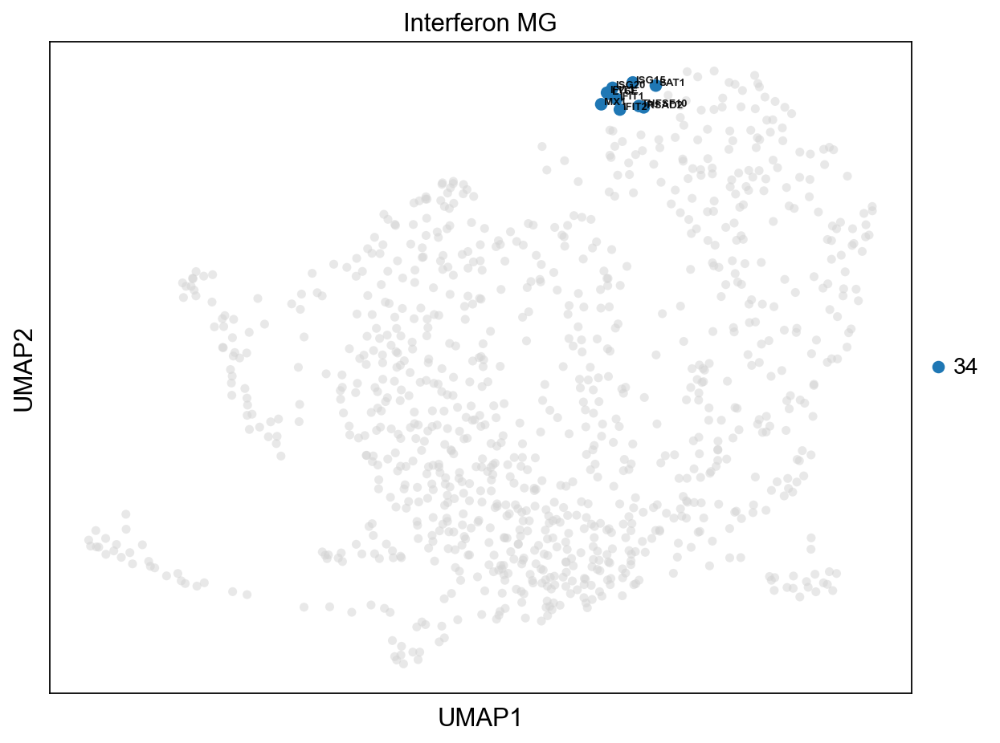

In [39]:
for clust, genes in metagenes.items():
    if "IFIT1" in genes:
        print(clust,genes)
        embed.plot_metagene(gdata, mg=clust, title="Interferon MG")
        break

# Find Markers of Cell Type and Batch

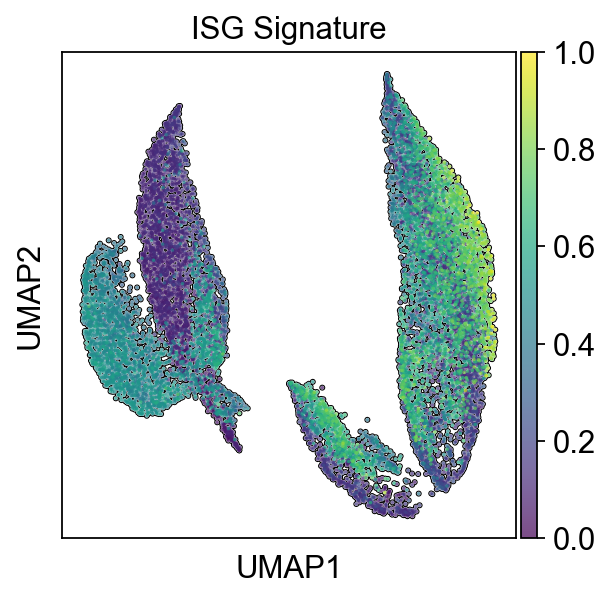

In [40]:
sc.pl.umap(adata,color=["{}_SCORE".format(clust)],
           add_outline=True,title="ISG Signature",size=10)

# Annotate Cell Types with Pseudo-probabilities

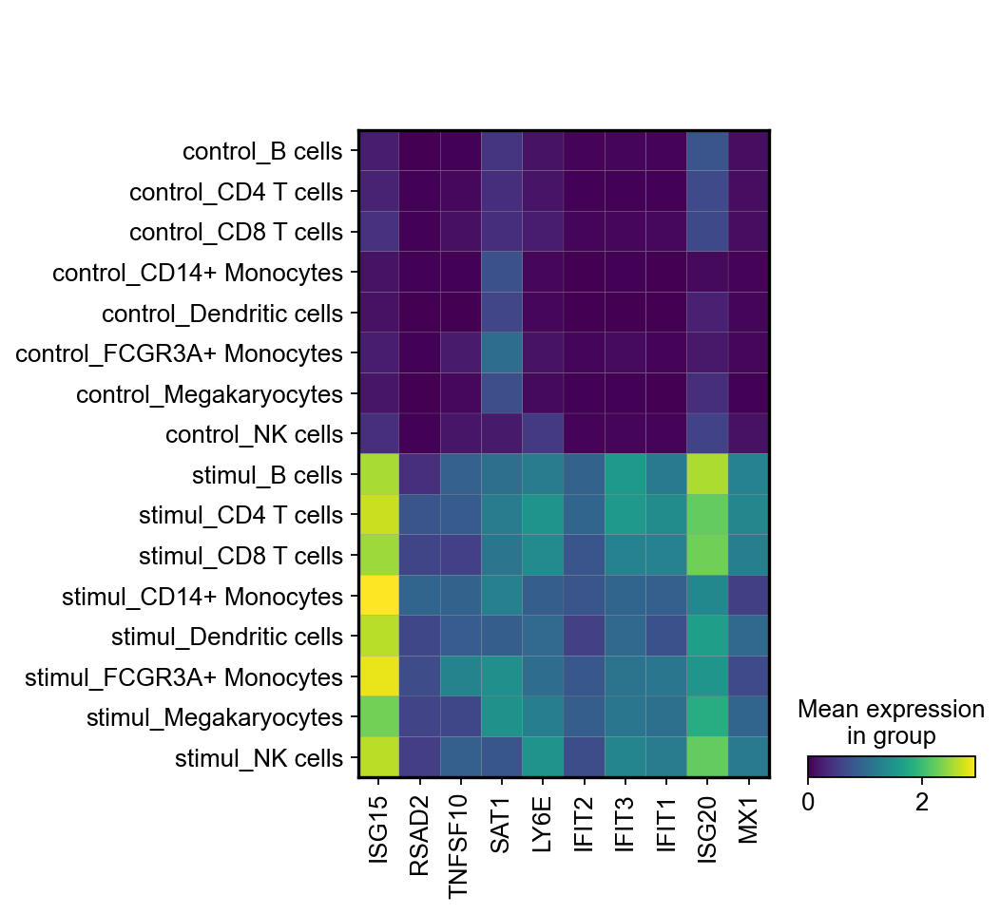

In [41]:
genes = [x for x in genes if x in adata.var.index.tolist()]
sc.pl.matrixplot(adata,genes,groupby="detailed_celltype")

# Plot All Metagenes

<Figure size 400x1040 with 0 Axes>

<Figure size 320x320 with 0 Axes>

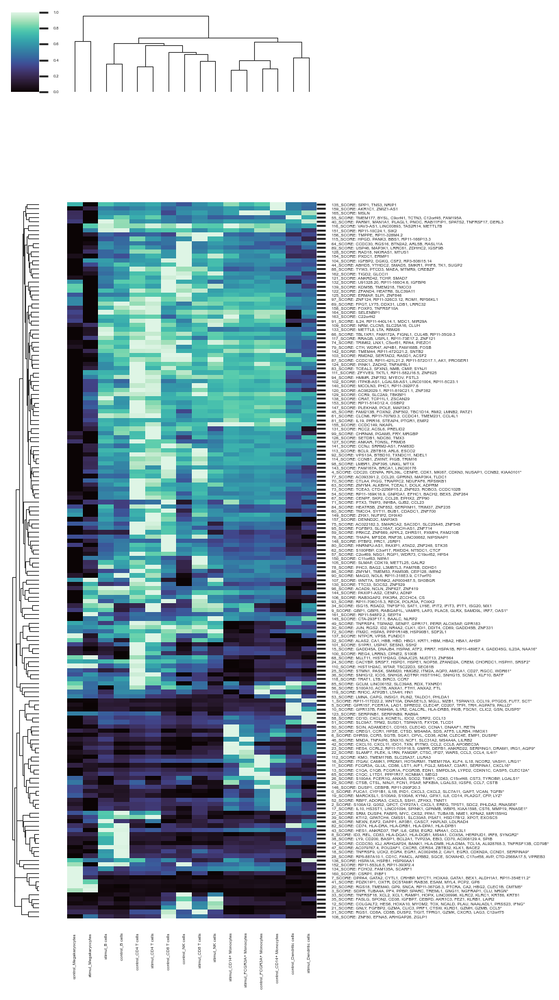

In [42]:
sns.set(font_scale=0.25)
embed.plot_metagenes_scores(adata,metagenes,"detailed_celltype")

# Find Similar Genes to Cell Type

In [52]:
import pandas
markers = cembed.get_predictive_genes(adata,"celltype",n_genes=15)
pandas.DataFrame.from_dict(markers).T

,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14
CD14+ Monocytes,KYNU,FCN1,TYROBP,MAFB,IGSF6,FCER1G,C15orf48,CST3,CTSB,NINJ1,PLA2G7,CFP,TIMP1,PLAUR,FTL
Dendritic cells,HLA-DMA,HLA-DQB1,HLA-DRB1,HLA-DRA,HLA-DQA1,CFP,KYNU,HLA-DPA1,LILRB4,HMOX1,HLA-DRB5,CD9,CD86,HLA-DPB1,FAM49A
CD4 T cells,CCR7,ISG20,LTB,ANXA1,LY6E,MX1,FTH1,ACTB,IFIT3,ISG15,IFIT1,CREM,HSP90AA1,RGCC,MT2A
CD8 T cells,FASLG,C12orf75,KLRD1,GZMA,HOPX,KLRB1,CXCR3,GZMH,CTSW,PRF1,CLIC3,CST7,FGFBP2,TIGIT,NKG7
Megakaryocytes,CA2,TSC22D1,QPCT,TUBB1,TREML1,MAP3K7CL,ACRBP,NRGN,CLU,RGS18,PID1,MMD,SPARC,SNCA,SDPR
B cells,SYNGR2,IRF8,MS4A1,HLA-DQA1,HLA-DQB1,CD83,CD79A,CD40,HLA-DMA,HLA-DPA1,REL,CD74,BANK1,CCDC50,HLA-DRB1
FCGR3A+ Monocytes,KYNU,TYROBP,CST3,FCER1G,FCN1,IGSF6,MAFB,C15orf48,TIMP1,CFP,NINJ1,GLUL,CTSB,PLAUR,SOD2
NK cells,FASLG,IGFBP7,SPON2,FEZ1,XCL2,LINC00996,XCL1,KLRC1,AKR1C3,LAIR2,KLRC2,KRT86,HOPX,CEBPD,PRSS23


In [46]:
adata = cembed.phenotype_probability(adata,markers,dict())

100%|██████████| 14039/14039 [00:00<00:00, 39749.71it/s]
/Users/nceglia/miniconda/lib/python3.9/site-packages/genevector-0.0.1-py3.9.egg/genevector/embedding.py:476: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  adata.obs[target_col] = ct


CD14+ Monocytes
Dendritic cells
CD4 T cells
CD8 T cells
Megakaryocytes
B cells
FCGR3A+ Monocytes
NK cells


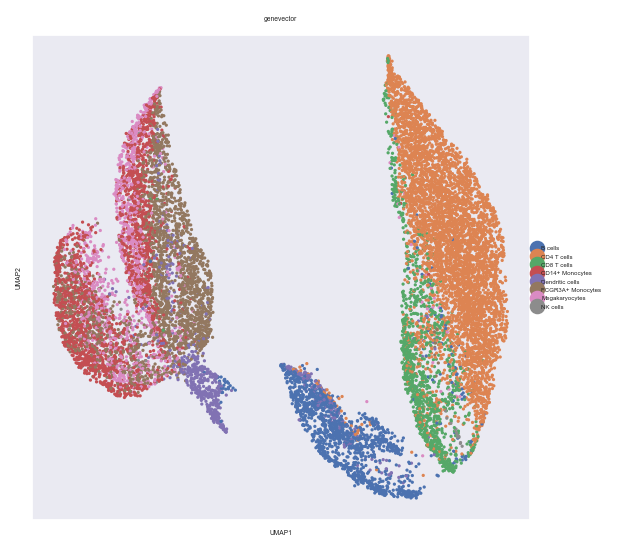

In [47]:
sc.pl.umap(adata,color="genevector")

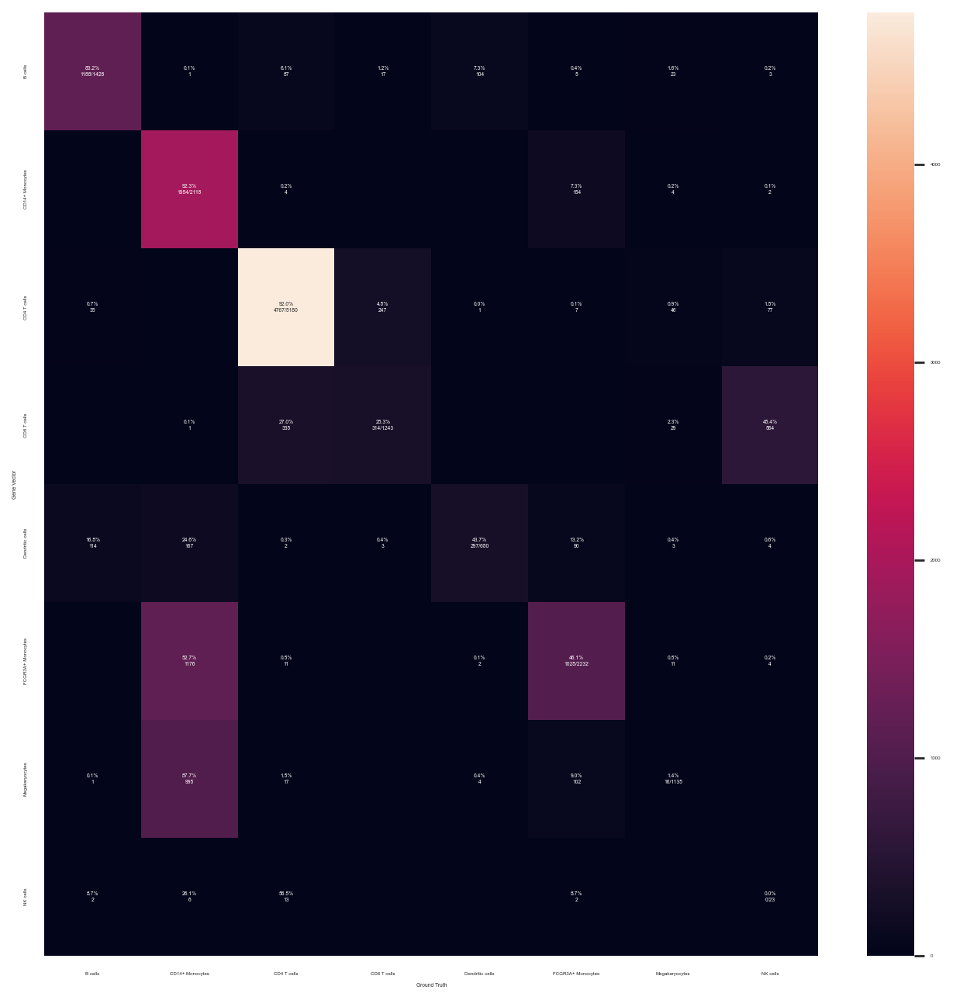

In [48]:
cembed.plot_confusion_matrix(adata,"genevector","celltype")

In [29]:

from sklearn.metrics.pairwise import cosine_similarity
from sklearn.manifold import TSNE
import operator

embedding = gdata.obsm["X_pca"]
distances = dict()
targets = gdata.obs.index.tolist()
tembed = embedding[gdata.obs.index.tolist().index("IFIT1")]
for target in targets:
    v = embedding[gdata.obs.index.tolist().index(target)]
    distance = float(cosine_similarity(numpy.array(tembed).reshape(1, -1),numpy.array(v).reshape(1, -1))[0])
    distances[target] = distance
sorted_distances = list(reversed(sorted(distances.items(), key=operator.itemgetter(1))))
genes = [x[0] for x in sorted_distances]
distance = [x[1] for x in sorted_distances]
df = pandas.DataFrame.from_dict({"Gene":genes, "Similarity":distance})

In [30]:
df.head(20)

,Gene,Similarity
0,IFIT1,1.000000
1,IFIT3,0.990738
2,MX1,0.969408
3,ISG15,0.962596
4,LY6E,0.954901
5,IFIT2,0.949256
6,SAMD9L,0.937414
7,OAS1,0.936891
8,RSAD2,0.915979
9,TNFSF10,0.870961


In [31]:
set(embed.compute_similarities("IFIT1").head(30)["Gene"].tolist()).difference(set(df.head(30)["Gene"].tolist()))

{'ANXA5',
 'CD63',
 'CSTB',
 'FCER1G',
 'GLRX',
 'HSPA1A',
 'HSPB1',
 'NFKBIA',
 'PSAP',
 'S100A10',
 'TXN'}

In [32]:
set(df.head(30)["Gene"].tolist()).difference(set(embed.compute_similarities("IFIT1").head(30)["Gene"].tolist()))

{'CCR7',
 'FTH1',
 'GBP5',
 'IFI27',
 'NEXN',
 'RABGAP1L',
 'SAMD9L',
 'SERPINB1',
 'TNFSF13B',
 'TYMP',
 'VAMP5'}

In [33]:
embedding = gdata.obsm["X_pca"]
distances = collections.defaultdict(dict)
targets = gdata.obs.index.tolist()
for mtarget in targets:
    tembed = embedding[gdata.obs.index.tolist().index(mtarget)]
    for target in targets:
        v = embedding[gdata.obs.index.tolist().index(target)]
        distance = float(cosine_similarity(numpy.array(tembed).reshape(1, -1),numpy.array(v).reshape(1, -1))[0])
        distances[mtarget][target] = distance

In [34]:
targets = list(embed.embeddings.keys())
gdistances = collections.defaultdict(dict)
for gene in gdata.obs.index.tolist():
    if gene not in embed.embeddings:
        continue
    embedding = embed.embeddings[gene]
    for target in targets:
        if target not in embed.embeddings:
            continue
        v = embed.embeddings[target]
        distance = float(cosine_similarity(numpy.array(embedding).reshape(1, -1),numpy.array(v).reshape(1, -1))[0])
        gdistances[gene][target] = distance

In [37]:
x = []
y = []
genes = []
dgenes = []
for gene, targets in gdistances.items():
    for target, sim in targets.items():
        if gene in distances and target in distances[gene]:
            genes.append(gene)
            dgenes.append(target)
            x.append(sim)
            y.append(distances[gene][target])
df = pandas.DataFrame.from_dict({"Gene":genes,"Target":dgenes,"g_sim":x,"p_sim":y})

In [38]:
df = df[df["Gene"]!=df["Target"]]
df["diff"] = numpy.abs(df["g_sim"] - df["p_sim"])

In [39]:
from scipy.stats import pearsonr
def plot_coexpression(gene1, gene2, adata, mi_scores, gsim, psim):
    prof1 = adata.X[:,adata.var.index.tolist().index(gene1)]
    prof2 = adata.X[:,adata.var.index.tolist().index(gene2)]
    fig,ax = plt.subplots(1,5,figsize=(16,4))
    sc.pl.umap(adata, color=[gene1], ax=ax[0], size=200, show=False)
    sc.pl.umap(adata, color=[gene2], ax=ax[1], size=200, show=False)
    sns.scatterplot(prof1,prof2,ax=ax[2])
    mi = mi_scores[gene1][gene2]
    r2 = pearsonr(prof1,prof2)
    sns.barplot(x=["MI","r2"],y=[mi/1000.0,r2.statistic],ax=ax[3])
    sns.barplot(x=["GV Sim","PCA Sim"],y=[gsim,psim],ax=ax[4])
    plt.tight_layout()

In [29]:
# sc.pp.normalize_total(adata)
# sc.pp.log1p(adata)
# sc.tl.pca(adata)
# sc.pp.neighbors(adata)
# sc.tl.umap(adata)

/Users/ceglian/miniconda3/lib/python3.9/site-packages/seaborn/_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(
/Users/ceglian/miniconda3/lib/python3.9/site-packages/seaborn/_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(
/Users/ceglian/miniconda3/lib/python3.9/site-packages/seaborn/_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warn

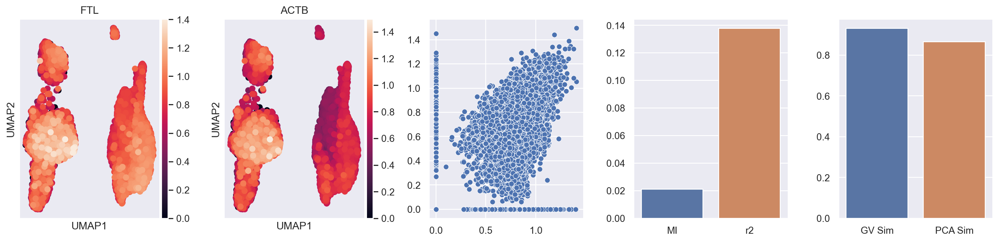

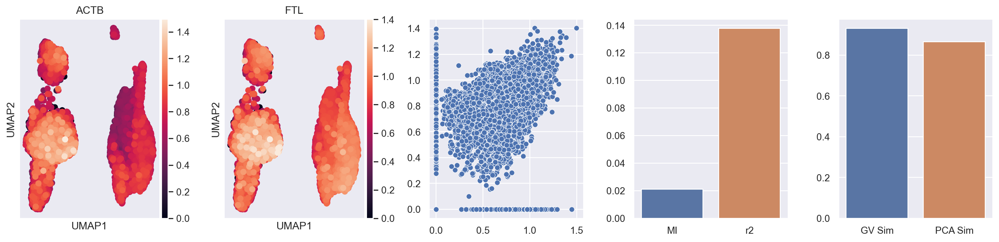

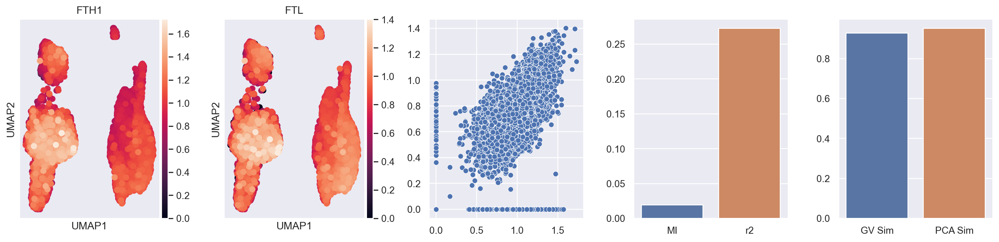

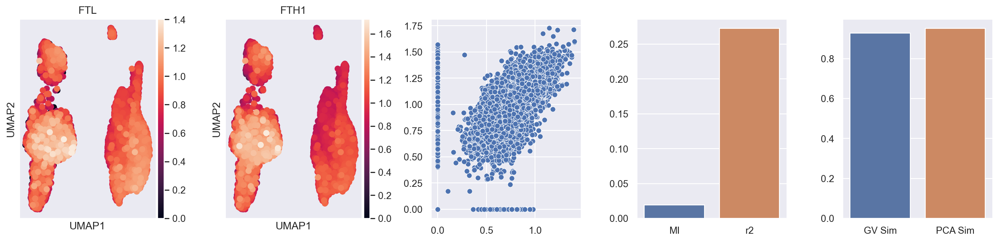

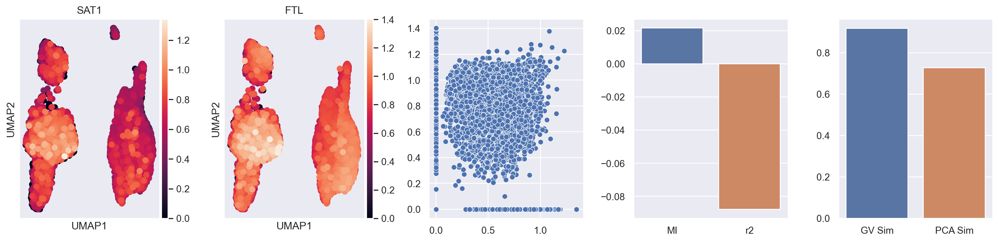

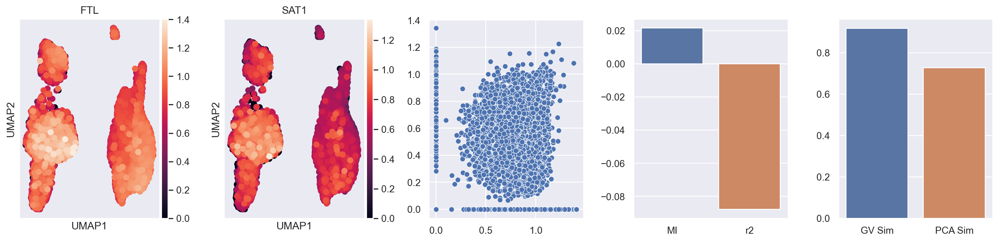

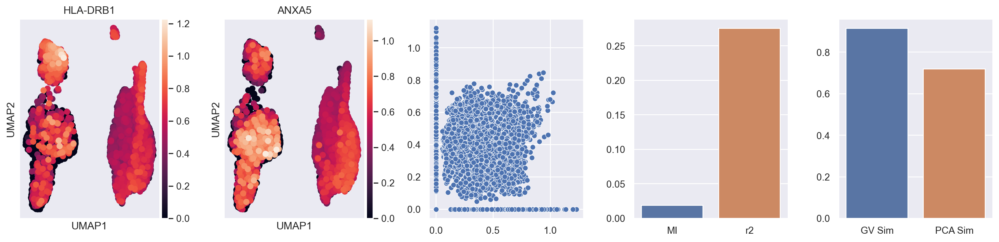

In [42]:
mismatched = df.sort_values("diff",ascending=True)
mismatched = mismatched.sort_values("g_sim",ascending=False).head(30)
sns.set(font_scale=1.)
i = 0
for x,y,w,z in zip(mismatched["Gene"], mismatched["Target"], mismatched["g_sim"], mismatched["p_sim"]):
    plot_coexpression(x, y, adata, dataset.mi_scores, w, z)
    if i > 5:
        break
    i += 1

In [43]:
from scipy.stats import pearsonr
def correlation(gene1,gene2):
    prof1 = adata.X[:,adata.var.index.tolist().index(gene1)]
    prof2 = adata.X[:,adata.var.index.tolist().index(gene2)]
    r2 = pearsonr(prof1,prof2)
    return r2
import tqdm
x = []
y = []
z = []
for gene, target in zip(df["Gene"],df["Target"]):
    if gene == target: continue
    try:
        r2 = correlation(gene,target)
        y.append(r2.statistic)
        z.append(r2.pvalue)
    except Exception as e:
        print(e)
        y.append(0.)
        z.append(1.)
    mi = mi_scores[gene][target]
    x.append(abs(mi))

df["MI"] = x
df["R2"] = y
df["R2pv"] = z

/Users/ceglian/miniconda3/lib/python3.9/site-packages/seaborn/_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


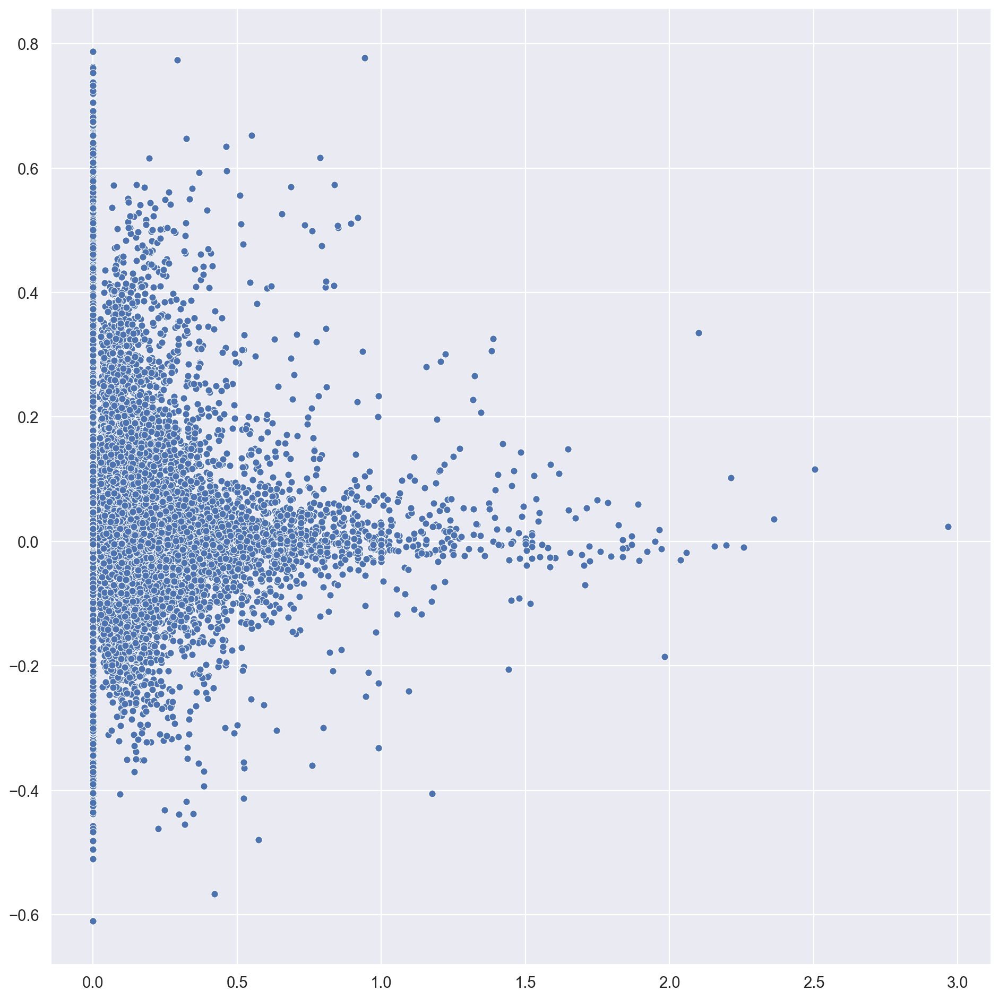

In [44]:
sns.set(font_scale=1.2)
fig, ax = plt.subplots(1,1,figsize=(12,12))
sns.scatterplot(x,y,ax=ax)
plt.tight_layout()

In [ ]:
import tqdm
from sklearn.preprocessing import StandardScaler, MinMaxScaler

context = dataset.data
adata = cembed.context.adata
adata.layers["counts"] = adata.X
sc.pp.normalize_total(adata)
sc.pp.log1p(adata)

cell_to_gene = list(cembed.context.cell_to_gene.items())
data = collections.defaultdict(list)
weights = collections.defaultdict(list)
pcs = dict()
embed_genes = list(embed.embeddings.keys())
matrix = []

for cell, genes in tqdm.tqdm(cell_to_gene):
    cell_weights = dict(zip(adata.var.index.tolist(),adata.X[adata.obs.index.tolist().index(cell),]))
    weights = []
    vectors = []
    for g,w in cell_weights.items():
        if w != 0.0 and g in embed.embeddings:
            weights.append(w)
            vectors.append(embed.embeddings[g])
    weights = numpy.array(weights)
    cembed.matrix.append(numpy.average(vectors,axis=0,weights=weights))
    cembed.data[cell] = vectors
cembed.dataset_vector = numpy.zeros(numpy.array(cembed.matrix).shape[1])

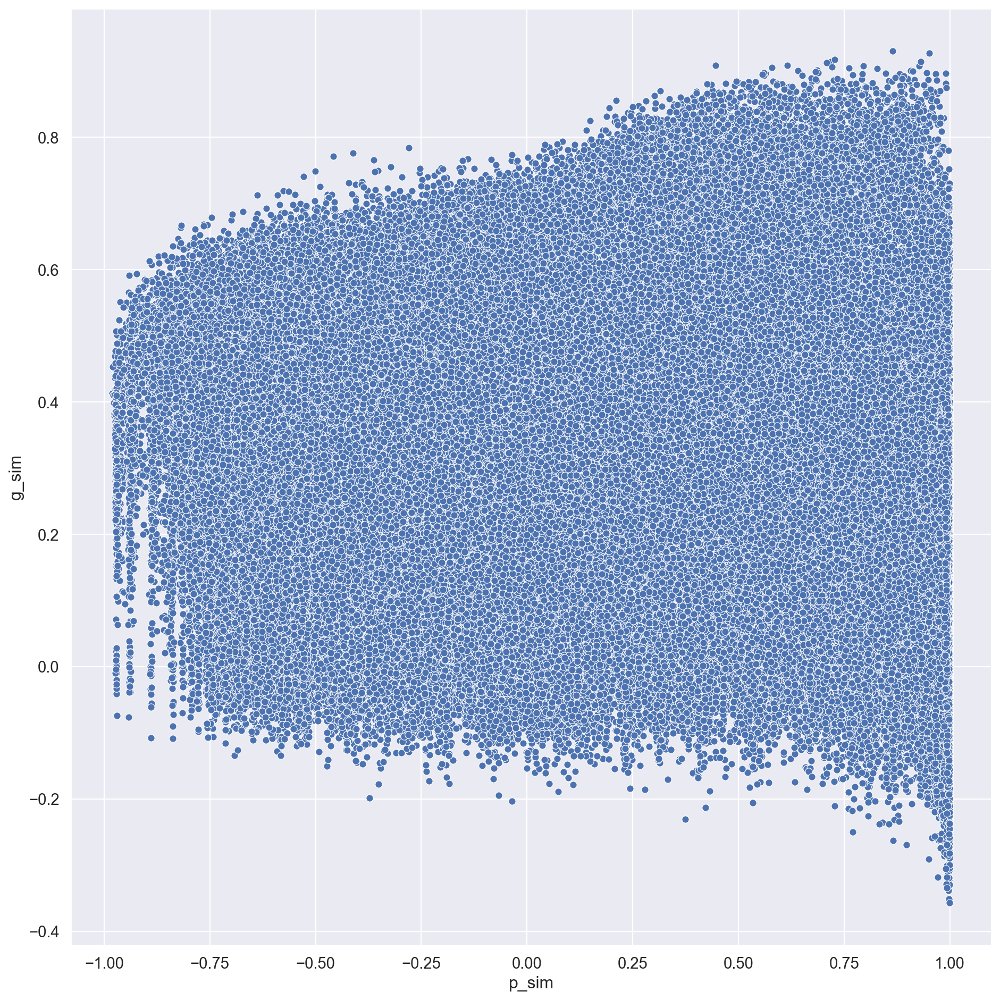

In [45]:
fig, ax = plt.subplots(1,1,figsize=(12,12))
sns.scatterplot(data=df,x="p_sim",y="g_sim",ax=ax)
plt.tight_layout()

In [62]:
dfx = df[df["diff"] > 1.5]
dfx


,Gene,Target,g_sim,p_sim,diff,MI,R2,R2pv
11773,RP11-169K16.9,TYMP,0.613034,-0.892368,1.505402,0.0,-0.042448,4.870682e-07
147369,FAM168B,FTH1,0.565262,-0.941347,1.506609,0.0,0.013505,1.095690e-01
393132,HOTAIRM1,FTH1,0.591032,-0.940792,1.531824,0.0,0.016040,5.737861e-02
600366,FTH1,FAM168B,0.565262,-0.941347,1.506609,0.0,0.013505,1.095690e-01
600477,FTH1,HOTAIRM1,0.591032,-0.940792,1.531824,0.0,0.016040,5.737861e-02
600661,FTH1,NCOR2,0.551040,-0.961504,1.512544,0.0,0.007913,3.485026e-01
696141,NCOR2,FTH1,0.551040,-0.961504,1.512544,0.0,0.007913,3.485026e-01
696142,NCOR2,FTL,0.593437,-0.922655,1.516093,0.0,0.019208,2.285555e-02
924397,FTL,NCOR2,0.593437,-0.922655,1.516093,0.0,0.019208,2.285555e-02
965008,TYMP,RP11-169K16.9,0.613034,-0.892368,1.505402,0.0,-0.042448,4.870682e-07


In [63]:
def plot_coexpression(gene1, gene2, adata):
    prof1 = adata.X[:,adata.var.index.tolist().index(gene1)]
    prof2 = adata.X[:,adata.var.index.tolist().index(gene2)]
    fig,ax = plt.subplots(1,3,figsize=(16,4))
    sc.pl.umap(adata, color=[gene1], ax=ax[0], size=200, show=False)
    sc.pl.umap(adata, color=[gene2], ax=ax[1], size=200, show=False)
    sns.scatterplot(prof1,prof2,ax=ax[2])
    plt.tight_layout()
for x,y in zip(df["Gene"],df["Target"]):
    plot_coexpression(x,y,adata)

normalizing counts per cell
    finished (0:00:00)
computing PCA
    on highly variable genes
    with n_comps=50
    finished (0:00:02)
computing neighbors
    using 'X_pca' with n_pcs = 50
    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:00:00)
computing UMAP
    finished: added
    'X_umap', UMAP coordinates (adata.obsm) (0:00:06)


/Users/ceglian/miniconda3/lib/python3.9/site-packages/seaborn/_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(
/Users/ceglian/miniconda3/lib/python3.9/site-packages/seaborn/_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(
/Users/ceglian/miniconda3/lib/python3.9/site-packages/seaborn/_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warn

KeyboardInterrupt: 

In [55]:
z = []
for gene, target in zip(df["Gene"],df["Target"]):
    z.append(distances[gene][target])
df["p_sim"] = z

In [56]:
embedding = gdata.obsm["X_pca"]
distances = collections.defaultdict(dict)
targets = gdata.obs.index.tolist()
for mtarget in targets:
    tembed = embedding[gdata.obs.index.tolist().index(mtarget)]
    for target in targets:
        v = embedding[gdata.obs.index.tolist().index(target)]
        x = numpy.array(tembed).reshape(1, -1)
        y = numpy.array(v).reshape(1, -1)
        distance = np.sum(np.square(x - y))
        distances[mtarget][target] = distance

In [57]:
embedding = gdata.obsm["X_pca"]
distances = collections.defaultdict(dict)
targets = gdata.obs.index.tolist()
for mtarget in targets:
    tembed = embedding[gdata.obs.index.tolist().index(mtarget)]
    for target in targets:
        v = embedding[gdata.obs.index.tolist().index(target)]
        x = numpy.array(tembed).reshape(1, -1)
        y = numpy.array(v).reshape(1, -1)
        distance = np.sum(np.square(x - y))
        distances[mtarget][target] = distance
z = []
for gene, target in zip(df["Gene"],df["Target"]):
    z.append(distances[gene][target])
df["p_sim_euc"] = z

In [58]:
df

,Gene,Target,g_sim,p_sim,diff,MI,R2,R2pv,p_sim_euc
0,HES4,ABHD5,-0.075836,-0.109036,0.621822,0.000000,-0.013351,0.113697,29.089518
1,HES4,AC002456.2,-0.012644,-0.064315,0.668851,0.000000,0.003908,0.643353,30.726109
2,HES4,AC006129.4,0.028370,-0.059151,0.685996,0.067964,0.015528,0.065798,30.373592
3,HES4,AC022182.3,0.003992,-0.113548,0.634852,0.000000,-0.010998,0.192566,30.576296
4,HES4,AC062029.1,0.003977,-0.069634,0.676395,0.000000,-0.008079,0.338494,31.115582
...,...,...,...,...,...,...,...,...,...
974164,S100B,ZNF80,0.381940,0.803342,1.038736,0.000000,-0.004104,0.626776,4.854325
974165,S100B,ZNF846,-0.088018,0.826607,0.584382,0.000000,0.012473,0.139461,4.122317
974166,S100B,ZNF852,0.138744,0.817236,0.794824,0.000000,0.001721,0.838467,4.412627
974167,S100B,ZSCAN29,-0.012818,0.810654,0.655497,0.000000,-0.004215,0.617497,4.657510


In [93]:
dfx = df[df["g_sim"] > 0.85]
dfx = dfx[dfx["p_sim_euc"]< 200.0]
dfx = dfx[dfx["p_sim"]< 0.]
dfx[["Gene","Target",""]]

,Gene,Target,g_sim,p_sim,diff,MI,R2,R2pv,p_sim_euc
115508,ID2,ALDH2,0.855909,-0.235389,1.525686,0.362377,0.014956,7.638503e-02,90.903381
117235,FAM49A,SERPINB1,0.866979,-0.102994,0.310121,0.213044,0.059768,1.366959e-12,131.472336
322038,SERPINB1,FAM49A,0.866979,-0.102994,1.311094,0.213044,0.059768,1.366959e-12,131.472336
322136,SERPINB1,HLA-DRB5,0.868549,-0.220115,1.450863,0.450040,0.017596,3.708075e-02,139.516129
348193,HLA-DRB5,SERPINB1,0.868549,-0.220115,0.311691,0.450040,0.017596,3.708075e-02,139.516129
690313,ALDH2,ID2,0.855909,-0.235389,0.710734,0.362377,0.014956,7.638503e-02,90.903381


Text(20.0, 0.5, 'PCA Cosine Similarity')

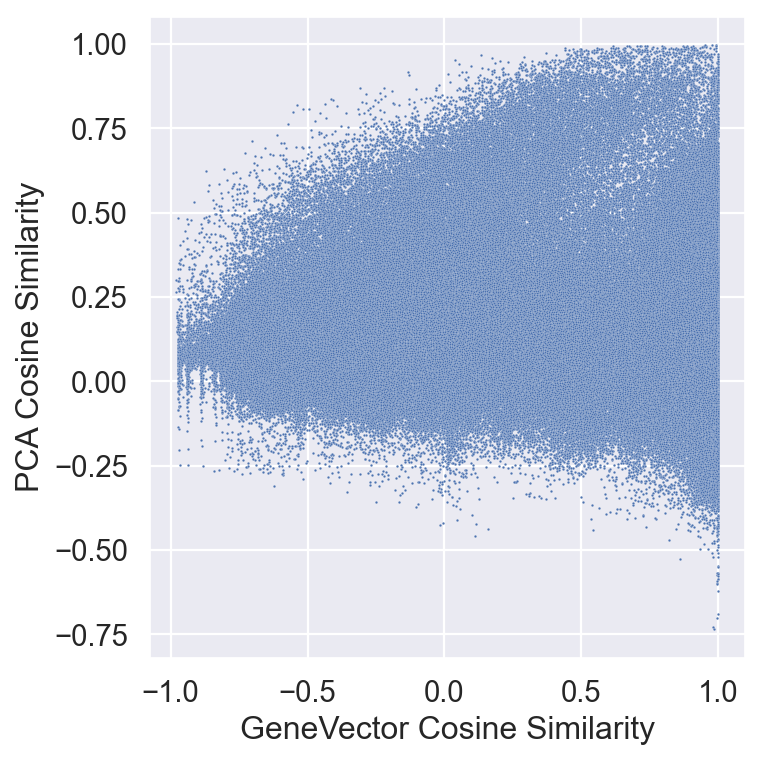

In [113]:
fig, ax = plt.subplots(1,1,figsize=(5,5))
sns.scatterplot(data=df,x="p_sim",y="g_sim",ax=ax,s=1)
plt.tight_layout()
plt.xlabel("GeneVector Cosine Similarity")
plt.ylabel("PCA Cosine Similarity")

/Users/ceglian/miniconda3/lib/python3.9/site-packages/seaborn/_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


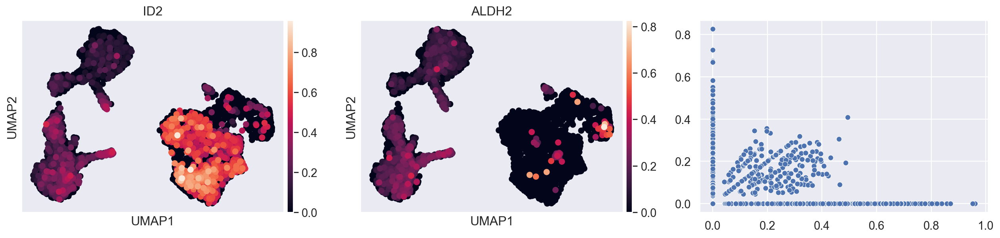

In [94]:
plot_coexpression("ID2","ALDH2",adata)

/Users/ceglian/miniconda3/lib/python3.9/site-packages/seaborn/_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


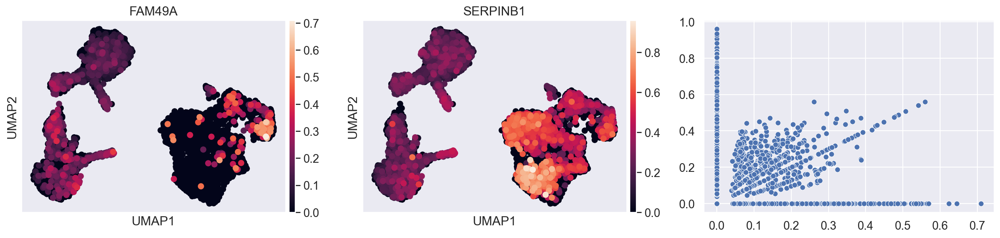

In [95]:
plot_coexpression("FAM49A","SERPINB1",adata)

/Users/ceglian/miniconda3/lib/python3.9/site-packages/seaborn/_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


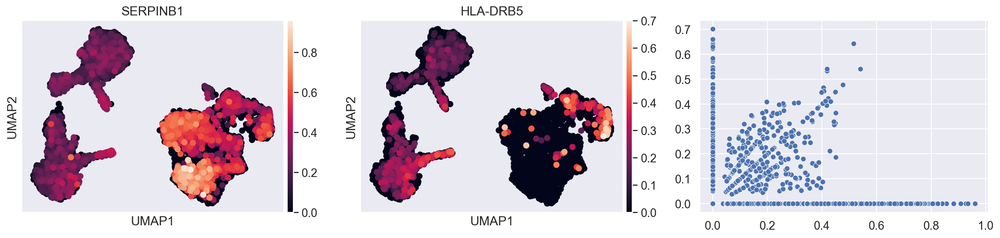

In [96]:
plot_coexpression("SERPINB1","HLA-DRB5",adata)

Text(0, 0.5, 'Number of Gene Pairs')

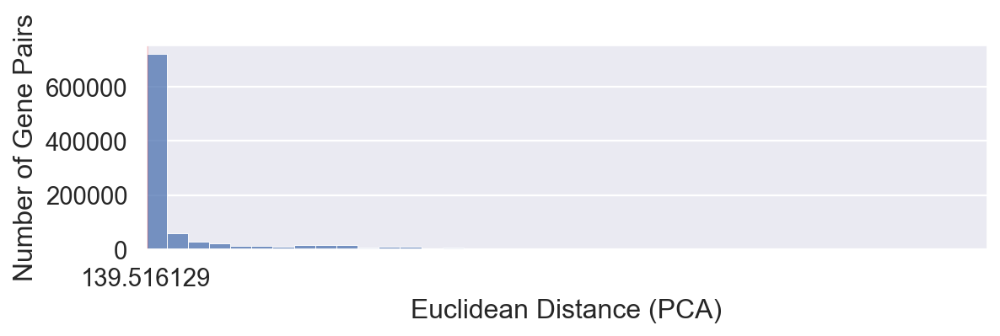

In [108]:
fig, ax = plt.subplots(1,1,figsize=(8,2))
sns.histplot(df["p_sim_euc"],bins=100, ax=ax)
ax.set_xlim(0,5000)
ax.axvline(x="139.516129",color="red")
ax.set_xlabel("Euclidean Distance (PCA)")
ax.set_ylabel("Number of Gene Pairs")

In [91]:
embedding = gdata.obsm["X_pca"]
source = "GPR137B"
target = "BIRC3"
source = embedding[gdata.obs.index.tolist().index(source)]
target = embedding[gdata.obs.index.tolist().index(target)]

print(numpy.var(source))
print(numpy.var(target))

print()

for pc1, pc2 in zip(source,target):
    print(abs(pc1-pc2))

0.09673259
28.228907

15.912979
13.222511
9.746327
2.2240226
5.340961
4.437271
1.9393752
2.2454915
6.620271
7.5518517
13.876681
2.495198
8.19549
0.5533477
1.5884328
2.6232567
0.63622916
9.2414665
12.983526
10.037626
2.5032651
5.8644304
5.4600477
1.3627833
1.3108039
0.45386672
2.1872363
6.5449433
1.1131322
2.843834
1.8718941
0.047140762
0.04761581
0.1416515
1.5773435
0.95015323
1.0992419
1.7058494
0.8798877
2.0015044
0.62315214
0.6649817
0.13175137
1.4169146
1.5422034
0.25332654
0.82205534
1.4917881
0.44172084
1.0739238


In [90]:
targets = list(embed.embeddings.keys())

source = "GPR137B"
target = "BIRC3"

source = embed.embeddings[source]
target = embed.embeddings[target]
print(numpy.var(source))
print(numpy.var(target))

print()
for pc1, pc2 in zip(source,target):
    print(abs(pc1-pc2))

1.3754418807504183
6.6999019971613265

0.7568774250000001
1.2156686999999997
0.182689375
2.9564411
1.6155038849999999
0.390299923
2.19465809
0.63347881
0.2118304199999999
1.4694470049999997
1.27728602
0.4330591549999998
1.030266665
1.4100143
0.727147
1.82668085
1.4035112299999999
2.43782295
1.3668716700000003
0.366354433
0.31870494500000013
0.7342541549999999
2.1788999650000003
0.78874869
1.5054630000000007
1.3733336999999999
0.11361978500000003
1.1765678400000001
0.11582984000000002
1.56906734
2.091313025
2.0432763499999997
1.902616575
0.96617083
0.47852586500000016
0.20216638249999996
1.5763590650000001
7.168296100000001
0.19774082999999998
1.233893025
0.9878216
1.1383255700000001
1.3391903250000001
0.6993251
1.8969016499999998
0.34714809999999985
2.18553495
0.9712042249999999
0.7849146899999999
2.31834745
2.6330161000000003
1.7586109000000003
0.23208590000000018
3.4971772999999997
1.1195539250000002
1.2279799500000004
0.1051883349999998
0.24254214499999993
0.8078951399999998
0.48198